In [5]:
import warnings
warnings.filterwarnings('ignore')


import pandas as pd
import numpy as np

from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns


# Importing librarys to use on interactive graphs
import plotly.offline as plty

from plotly import subplots
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go



# to set a style to all graphs
plt.style.use('fivethirtyeight')
init_notebook_mode(connected=True)
sns.set_style("whitegrid")
sns.set_context("paper")

In [6]:
df_train = pd.read_csv("dataset-flat.csv")

In [7]:
pd.options.display.max_columns = 100
df_train.head(3)

,channelGrouping,date,fullVisitorId,sessionId,socialEngagementType,visitId,visitNumber,visitStartTime,device.browser,device.browserVersion,device.browserSize,device.operatingSystem,device.operatingSystemVersion,device.isMobile,device.mobileDeviceBranding,device.mobileDeviceModel,device.mobileInputSelector,device.mobileDeviceInfo,device.mobileDeviceMarketingName,device.flashVersion,device.language,device.screenColors,device.screenResolution,device.deviceCategory,geoNetwork.continent,geoNetwork.subContinent,geoNetwork.country,geoNetwork.region,geoNetwork.metro,geoNetwork.city,geoNetwork.cityId,geoNetwork.networkDomain,geoNetwork.latitude,geoNetwork.longitude,geoNetwork.networkLocation,totals.visits,totals.hits,totals.pageviews,totals.bounces,totals.newVisits,totals.transactionRevenue,trafficSource.campaign,trafficSource.source,trafficSource.medium,trafficSource.keyword,trafficSource.adwordsClickInfo.criteriaParameters,trafficSource.referralPath,trafficSource.isTrueDirect,trafficSource.adwordsClickInfo.page,trafficSource.adwordsClickInfo.slot,trafficSource.adwordsClickInfo.gclId,trafficSource.adwordsClickInfo.adNetworkType,trafficSource.adwordsClickInfo.isVideoAd,trafficSource.adContent
0,Organic Search,20160902,357659889600827884,357659889600827884_1472839882,Not Socially Engaged,1472839882,1,1472839882,Safari,not available in demo dataset,not available in demo dataset,iOS,not available in demo dataset,True,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,mobile,Asia,Western Asia,Turkey,Izmir,(not set),Izmir,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1.0,1.0,1.0,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Organic Search,20160902,676298261706930871,0676298261706930871_1472815056,Not Socially Engaged,1472815056,1,1472815056,Chrome,not available in demo dataset,not available in demo dataset,Windows,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Europe,Western Europe,Netherlands,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,uvt.nl,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1.0,1.0,1.0,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Organic Search,20160902,1381975521299261523,1381975521299261523_1472829727,Not Socially Engaged,1472829727,1,1472829727,Chrome,not available in demo dataset,not available in demo dataset,Macintosh,not available in demo dataset,False,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,not available in demo dataset,desktop,Asia,Eastern Asia,South Korea,Seoul,(not set),Seoul,not available in demo dataset,unknown.unknown,not available in demo dataset,not available in demo dataset,not available in demo dataset,1,1,1.0,1.0,1.0,NaN,(not set),google,organic,(not provided),not available in demo dataset,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Function to Describe each column

In [8]:
# Define a function named DataDesc that takes a DataFrame df as input
def DataDesc(df):
    # Print the shape of the dataset
    print(f"Dataset Shape: {df.shape}")

    # Create a summary DataFrame to store information about the dataset
    summary = pd.DataFrame(df.dtypes, columns=['dtypes'])  # Create a DataFrame with data types of columns
    summary = summary.reset_index()  # Reset the index of the DataFrame
    summary['Name'] = summary['index']  # Create a 'Name' column to store the column names
    summary = summary[['Name', 'dtypes']]  # Keep only 'Name' and 'dtypes' columns

    # Calculate the number of missing values for each column and add it to the summary
    summary['Missing'] = df.isnull().sum().values

    # Calculate the number of unique values for each column and add it to the summary
    summary['Uniques'] = df.nunique().values

    # Add the first three values of each column to the summary
    summary['First Value'] = df.loc[0].values
    summary['Second Value'] = df.loc[1].values
    summary['Third Value'] = df.loc[2].values

    # Calculate the entropy for each column and add it to the summary
    for name in summary['Name'].value_counts().index:
        # Calculate the entropy using the scipy.stats.entropy function
        summary.loc[summary['Name'] == name, 'Entropy'] = round(stats.entropy(df[name].value_counts(normalize=True), base=2), 2)

    # Return the summary DataFrame with all the calculated information
    return summary

In [9]:
DataDesc(df_train)

Dataset Shape: (63282, 54)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,channelGrouping,object,0,8,Organic Search,Organic Search,Organic Search,2.10
1,date,int64,0,366,20160902,20160902,20160902,8.45
2,fullVisitorId,object,0,61589,357659889600827884,676298261706930871,1381975521299261523,15.89
3,sessionId,object,0,63279,357659889600827884_1472839882,0676298261706930871_1472815056,1381975521299261523_1472829727,15.95
4,socialEngagementType,object,0,1,Not Socially Engaged,Not Socially Engaged,Not Socially Engaged,0.00
5,visitId,int64,0,63195,1472839882,1472815056,1472829727,15.95
6,visitNumber,int64,0,190,1,1,1,1.42
7,visitStartTime,int64,0,63196,1472839882,1472815056,1472829727,15.95
8,device.browser,object,0,28,Safari,Chrome,Chrome,1.50
9,device.browserVersion,object,0,1,not available in demo dataset,not available in demo dataset,not available in demo dataset,0.00


1. There are a lot of constant columns having only one unique value
2. Target column = totals.transactionRevenue (Null value = No Revenue/ Total 62470 Null Values)
3. Columns with prefix trafficSource contain Null values majorly, hence we will drop these columns

###  Describing Columns with Null Values

In [10]:
# Define a function named Null_Count that takes a DataFrame df as input
def Null_Count(df):
    # Calculate the number of null values for each column, sort them in descending order, and reset the index
    df_null = df.isnull().sum().sort_values(ascending=False).rename('Null').reset_index()

    # Extract the null counts and calculate the null percentage for each column
    null_count = df_null['Null']
    null_percent = (null_count * 100) / (df.shape[0])

    # Create a new DataFrame by concatenating 'index', 'null_count', and 'null_percent' columns
    df_null = pd.concat([df_null['index'], null_count, null_percent], axis=1, keys=['Column', 'Null_Count', 'Null_Percent'])

    # Return a subset of the DataFrame where the 'Null_Count' is not equal to 0
    return df_null[df_null['Null_Count'] != 0]

# Call the Null_Count function with a DataFrame named df_train and print the results
Null_Count(df_train)


,Column,Null_Count,Null_Percent
0,trafficSource.adContent,62562,98.862236
1,totals.transactionRevenue,62470,98.716855
2,trafficSource.adwordsClickInfo.isVideoAd,61812,97.677065
3,trafficSource.adwordsClickInfo.adNetworkType,61812,97.677065
4,trafficSource.adwordsClickInfo.slot,61812,97.677065
5,trafficSource.adwordsClickInfo.page,61812,97.677065
6,trafficSource.adwordsClickInfo.gclId,61803,97.662843
7,trafficSource.isTrueDirect,44057,69.620113
8,trafficSource.referralPath,40235,63.580481
9,trafficSource.keyword,35206,55.633513


###  Function to Fill Null Values

In [11]:
# Define a function named fill_na that takes a DataFrame df as input
def fill_na(df):
    # Fill missing values in specific columns with predefined values
    df['totals.pageviews'].fillna(1, inplace=True)
    df['totals.newVisits'].fillna(0, inplace=True)
    df['totals.bounces'].fillna(0, inplace=True)
    df["totals.transactionRevenue"].fillna(0.0, inplace=True)

    # Change data types of columns from object to the desired ones
    df['totals.pageviews'] = df['totals.pageviews'].astype(int)
    df['totals.newVisits'] = df['totals.newVisits'].astype(int)
    df['totals.bounces'] = df['totals.bounces'].astype(int)
    df["totals.transactionRevenue"] = df["totals.transactionRevenue"].astype(float)

    # Fill missing values in other specific columns with predefined values
    df['trafficSource.isTrueDirect'].fillna(False, inplace=True)
    df['trafficSource.adwordsClickInfo.isVideoAd'].fillna(True, inplace=True)  # Filling boolean with True

    # Replace "(not set)" with NaN in the 'geoNetwork.city' column
    df[df_train['geoNetwork.city'] == "(not set)"]['geoNetwork.city'] = np.nan
    df['geoNetwork.city'].fillna("NaN", inplace=True)

    return df

# Call the fill_na function with a DataFrame named df_train and update the DataFrame in place
df_train = fill_na(df_train)


In [12]:
df_train['fullVisitorId'] = df_train['fullVisitorId'].astype(float)
df_train['sessionId'] = df_train['sessionId'].astype(float)

###  Processing Date/Time Columns

In [13]:
from datetime import datetime

# This function is to extract date features
def date_process(df):
    df["date"] = pd.to_datetime(df["date"], format="%Y%m%d") # seting the column as pandas datetime
    df["weekday"] = df['date'].dt.weekday #extracting week day
    df["day"] = df['date'].dt.day # extracting day
    df["month"] = df['date'].dt.month # extracting month
    df["year"] = df['date'].dt.year # extracting year
    df['visitHour'] = (df['visitStartTime'].apply(lambda x: str(datetime.fromtimestamp(x).hour))).astype(int)

    return df

df_train = date_process(df_train)

###  Removing Constant Columns

In [14]:
constant_columns = [col for col in df_train.columns if df_train[col].nunique() == 1]
print(f'Columns : {constant_columns}, \n Num of Columns : {len(constant_columns)}')


df_train.drop(constant_columns, axis=1, inplace=True)

Columns : ['socialEngagementType', 'device.browserVersion', 'device.browserSize', 'device.operatingSystemVersion', 'device.mobileDeviceBranding', 'device.mobileDeviceModel', 'device.mobileInputSelector', 'device.mobileDeviceInfo', 'device.mobileDeviceMarketingName', 'device.flashVersion', 'device.language', 'device.screenColors', 'device.screenResolution', 'geoNetwork.cityId', 'geoNetwork.latitude', 'geoNetwork.longitude', 'geoNetwork.networkLocation', 'totals.visits', 'trafficSource.adwordsClickInfo.criteriaParameters'], 
 Num of Columns : 19


###  Dropping Null Columns

In [15]:
Null_Count(df_train)

,Column,Null_Count,Null_Percent
0,trafficSource.adContent,62562,98.862236
1,trafficSource.adwordsClickInfo.slot,61812,97.677065
2,trafficSource.adwordsClickInfo.adNetworkType,61812,97.677065
3,trafficSource.adwordsClickInfo.page,61812,97.677065
4,trafficSource.adwordsClickInfo.gclId,61803,97.662843
5,trafficSource.referralPath,40235,63.580481
6,trafficSource.keyword,35206,55.633513


In [16]:
df_train.drop(list(Null_Count(df_train)['Column']), axis=1,inplace=True)

###  Exploring Dataset after cleaning and processing

In [17]:
DataDesc(df_train)

Dataset Shape: (63282, 33)


,Name,dtypes,Missing,Uniques,First Value,Second Value,Third Value,Entropy
0,channelGrouping,object,0,8,Organic Search,Organic Search,Organic Search,2.10
1,date,datetime64[ns],0,366,2016-09-02 00:00:00,2016-09-02 00:00:00,2016-09-02 00:00:00,8.45
2,fullVisitorId,float64,0,60916,357659889600827904.0,676298261706930816.0,1381975521299261440.0,15.86
3,sessionId,float64,0,60916,3576598896008278906486390784.0,6762982617069309085219815424.0,13819755212992614186549772288.0,15.86
4,visitId,int64,0,63195,1472839882,1472815056,1472829727,15.95
5,visitNumber,int64,0,190,1,1,1,1.42
6,visitStartTime,int64,0,63196,1472839882,1472815056,1472829727,15.95
7,device.browser,object,0,28,Safari,Chrome,Chrome,1.50
8,device.operatingSystem,object,0,14,iOS,Windows,Macintosh,2.19
9,device.isMobile,bool,0,2,True,False,False,0.83


# Exploring Revenue

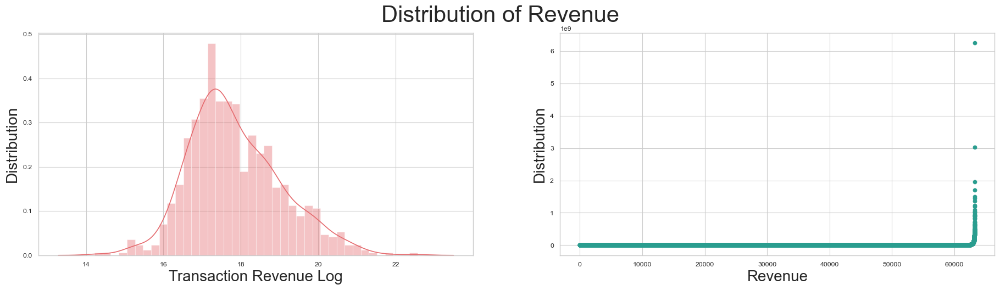

In [18]:
# Create a figure with a specific size
fig = plt.figure(figsize=(20, 5))

# Set the super title of the figure
plt.suptitle('Distribution of Revenue', fontsize=30)

# Create the first subplot on the left (121)
ax1 = fig.add_subplot(121)

# Create a distribution plot for the natural logarithm of 'totals.transactionRevenue' values
_ = sns.distplot(np.log(df_train[df_train['totals.transactionRevenue'] > 0]["totals.transactionRevenue"]), bins=40, color='#e56b6f', ax=ax1)

# Set the y-axis label and x-axis label for the first subplot
_ = ax1.set_ylabel('Distribution', fontsize=20)
_ = ax1.set_xlabel('Transaction Revenue Log', fontsize=20)

# Create the second subplot on the right (122)
ax2 = fig.add_subplot(122)

# Create a scatter plot of the sorted 'totals.transactionRevenue' values
_ = plt.scatter(range(df_train.shape[0]), np.sort(df_train['totals.transactionRevenue'].values), color='#2a9d8f')

# Set the y-axis label and x-axis label for the second subplot
_ = ax2.set_ylabel('Distribution', fontsize=20)
_ = ax2.set_xlabel('Revenue', fontsize=20)


According to the 80-20 rule of market revenue, only a small percentage of customers produce most of the revenue

# Caluculating Outliers

In [19]:
# Define a class named 'color' to create text color codes
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

# Define a function named 'CalOutliers' that takes a numerical DataFrame 'df_num' as input
def CalOutliers(df_num):
    # Calculate the mean and standard deviation of the input numerical data
    data_mean, data_std = np.mean(df_num), np.std(df_num)

    # Set the cut line to both higher and lower values based on the standard deviation (you can adjust this value)
    cut = data_std * 3

    # Calculate the lower and upper cut values
    lower, upper = data_mean - cut, data_mean + cut

    # Create arrays of values that are lower outliers, higher outliers, and total outliers
    outliers_lower = [x for x in df_num if x < lower]
    outliers_higher = [x for x in df_num if x > upper]
    outliers_total = [x for x in df_num if x < lower or x > upper]

    # Create an array of values without outlier values
    outliers_removed = [x for x in df_num if x > lower and x < upper]

    # Print the counts and percentages of outliers and non-outliers
    print(color.BOLD + f'Lower outliers: {len(outliers_lower)}' + color.END)  # Number of values in the lower cut of outliers
    print(color.BOLD + f'Upper outliers: {len(outliers_higher)}' + color.END)  # Number of values in the higher cut of outliers
    print(color.BOLD + f'Total outliers: {len(outliers_total)}' + color.END)  # Number of values that are outliers on both sides
    print(color.BOLD + f'Non-outliers: {len(outliers_removed)}' + color.END)  # Number of non-outlier values
    print(color.BOLD + f'% of Outliers: {round((len(outliers_total) / len(outliers_removed)) * 100, 4)}' + color.END)  # Percentage of outliers in the data


In [20]:
CalOutliers(df_train['totals.transactionRevenue'])

Lower outliers: 0
Upper outliers: 205
Total outliers: 205
Non-outliers: 63077
% of Outliers: 0.325


### Revenue based on Browsers/Device/Operating System

In [21]:
# Import necessary libraries
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly as plty

# Define a function to create a horizontal bar chart trace
def horizontal_bar_chart(cnt_srs, color):
    trace = go.Bar(
        y=cnt_srs.index[::-1],  # Reverse the index to display the highest count at the top
        x=cnt_srs.values[::-1],  # Reverse the values to match the index
        showlegend=True,
        orientation='h',  # Horizontal bar chart
        marker=dict(
            color=color,
        ),
    )
    return trace

# Grouping and aggregating data for device browser, device category, and operating system
# Device Browser
cnt_srs = df_train.groupby('device.browser')['totals.transactionRevenue'].agg(['size', 'sum', 'mean'])
cnt_srs.columns = ["count", "total revenue", "mean"]
cnt_srs = cnt_srs.sort_values(by="count", ascending=False)
trace1 = horizontal_bar_chart(cnt_srs["count"].head(10), '#073b4c')
trace2 = horizontal_bar_chart(cnt_srs["total revenue"].head(10), '#073b4c')
trace3 = horizontal_bar_chart(cnt_srs["mean"].head(10), '#073b4c')

# Device Category
cnt_srs = df_train.groupby('device.deviceCategory')['totals.transactionRevenue'].agg(['size', 'sum', 'mean'])
cnt_srs.columns = ["count", "total revenue", "mean"]
cnt_srs = cnt_srs.sort_values(by="count", ascending=False)
trace4 = horizontal_bar_chart(cnt_srs["count"].head(10), '#118ab2')
trace5 = horizontal_bar_chart(cnt_srs["total revenue"].head(10), '#118ab2')
trace6 = horizontal_bar_chart(cnt_srs["mean"].head(10), '#118ab2')

# Operating System
cnt_srs = df_train.groupby('device.operatingSystem')['totals.transactionRevenue'].agg(['size', 'sum', 'mean'])
cnt_srs.columns = ["count", "total revenue", "mean"]
cnt_srs = cnt_srs.sort_values(by="count", ascending=False)
trace7 = horizontal_bar_chart(cnt_srs["count"].head(10), '#ef476f')
trace8 = horizontal_bar_chart(cnt_srs["total revenue"].head(10), '#ef476f')
trace9 = horizontal_bar_chart(cnt_srs["mean"].head(10), '#ef476f')

# Create subplots for the visualizations
fig = make_subplots(rows=3, cols=3, vertical_spacing=0.04,
                    subplot_titles=["Device Browser - Count", "Device Browser - Total Revenue", "Device Browser - Mean Revenue",
                                    "Device Category - Count",  "Device Category - Total Revenue ", "Device Category - Mean Revenue",
                                    "Device OS - Count", "Device OS - Total Revenue", "Device OS - Mean Revenue"])

# Append the traces to the subplots
fig.append_trace(trace1, 1, 1)
fig.append_trace(trace2, 1, 2)
fig.append_trace(trace3, 1, 3)
fig.append_trace(trace4, 2, 1)
fig.append_trace(trace5, 2, 2)
fig.append_trace(trace6, 2, 3)
fig.append_trace(trace7, 3, 1)
fig.append_trace(trace8, 3, 2)
fig.append_trace(trace9, 3, 3)

# Update the layout and display the plot
# Update the layout and display the plot
fig['layout'].update(height=1200, width=1500, template='plotly_white', paper_bgcolor='#ffffff', title="Device Plots")
plty.offline.iplot(fig, filename='device-plots')



# Channel Groups and their Revenue

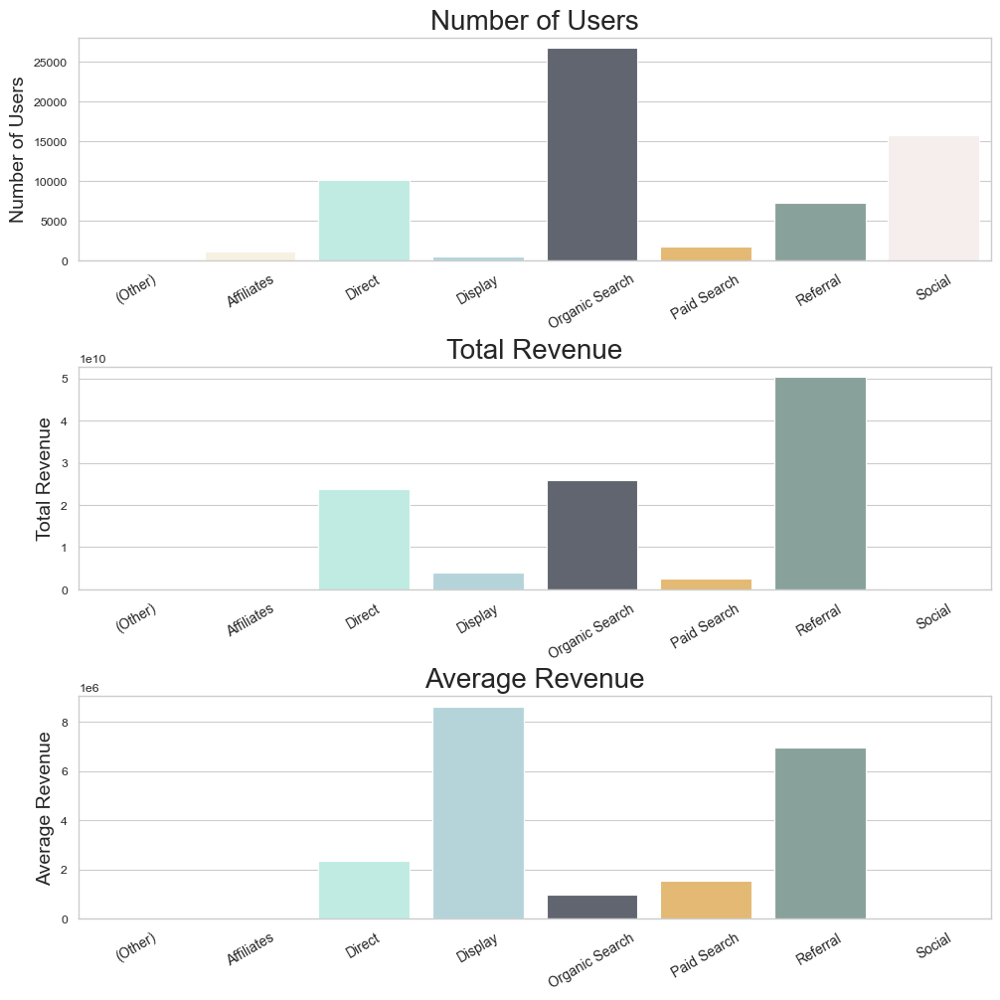

In [22]:
# Grouping the data by 'channelGrouping' and aggregating transaction revenue statistics
group = df_train.groupby('channelGrouping')['totals.transactionRevenue'].agg(['count','sum','mean']).reset_index()

# Define a custom color palette for the bar plots
color = ["#ffa69e","#faf3dd","#b8f2e6","#aed9e0","#5e6472",'#f6bd60','#84a59d','#f8edeb']
customPalette = sns.set_palette(sns.color_palette(color))

# Create a figure with 3 subplots in a single column
fig = plt.figure(figsize=(10, 10))

# Subplot 1: Number of Users
ax1 = fig.add_subplot(311)
_ = sns.barplot(data=group, x='channelGrouping', y='count', palette=customPalette, ax=ax1)
xlabels = group['channelGrouping'].to_list()
ylabels = group['count']
_ = ax1.set_title('Number of Users', fontsize=20)
_ = ax1.set_ylabel('Number of Users', fontsize=14)
_ = ax1.set_xlabel('')
_ = ax1.set_xticklabels(xlabels, rotation=30, fontsize=10)

# Subplot 2: Total Revenue
ax2 = fig.add_subplot(312)
_ = sns.barplot(data=group, x='channelGrouping', y='sum', palette=customPalette, ax=ax2)
xlabels = group['channelGrouping'].to_list()
ylabels = group['sum']
_ = ax2.set_title('Total Revenue', fontsize=20)
_ = ax2.set_ylabel('Total Revenue', fontsize=14)
_ = ax2.set_xlabel('')
_ = ax2.set_xticklabels(xlabels, rotation=30, fontsize=10)

# Subplot 3: Average Revenue
ax3 = fig.add_subplot(313)
_ = sns.barplot(data=group, x='channelGrouping', y='mean', palette=customPalette, ax=ax3)
xlabels = group['channelGrouping'].to_list()
ylabels = group['mean']
_ = ax3.set_title('Average Revenue', fontsize=20)
_ = ax3.set_ylabel('Average Revenue', fontsize=14)
_ = ax3.set_xlabel('')
_ = ax3.set_xticklabels(xlabels, rotation=30, fontsize=10)

# Adjust the layout of the subplots to prevent overlap
fig.tight_layout(pad=0.5)


In [23]:
# Group the data by 'channelGrouping' and 'device.browser' and count the occurrences
group = df_train.groupby(['channelGrouping', 'device.browser']).size().rename('Count').reset_index()

# Sort the data within each 'channelGrouping' group by 'Count' in descending order
group_sorted = group.groupby(['channelGrouping']).apply(lambda x: x.sort_values(['Count'], ascending=False)).reset_index(drop=True)

# Select the top four entries for each 'channelGrouping'
group_top_four = group_sorted.groupby(['channelGrouping']).head(4)

# Define a custom color palette for the bar chart
colors = ["#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", '#457b9d']

# Create a bar chart using Plotly Express
px.bar(data_frame=group_top_four, x='channelGrouping', y='Count', color='device.browser', template='plotly_white', color_discrete_sequence=colors)


Which browser is used on which device to shop?

In [24]:
# Group the data by 'device.operatingSystem' and 'device.browser' and count the occurrences
group = df_train.groupby(['device.operatingSystem', 'device.browser']).size().rename('Count').reset_index()

# Sort the data within each 'device.operatingSystem' group by 'Count' in descending order
group_sorted = group.groupby(['device.operatingSystem']).apply(lambda x: x.sort_values(['Count'], ascending=False)).reset_index(drop=True)

# Select the top four entries for each 'device.operatingSystem'
group_top_four = group_sorted.groupby(['device.operatingSystem']).head(4)

# Define a custom color palette for the bar chart
colors = ["#ff9f1c", "#ffbf69", "#cbf3f0", "#2ec4b6", "#264653", "#2a9d8f", "#e9c46a", "#f4a261", "#e76f51", "#e63946", "#f1faee", "#a8dadc", "#457b9d", "#1d3557"]

# Create a bar chart using Plotly Express
px.bar(data_frame=group_top_four, x='device.operatingSystem', y='Count', color='device.browser', template='plotly_white', color_discrete_sequence=colors)


1. Safari is mostly used on Mac OS and IOS devices
2. Chrome is quite popular in most of the devices

### Normalizing Transaction Revenue 

In [25]:


df_train['totals.transactionRevenue'] = df_train['totals.transactionRevenue'].apply(lambda x: np.log1p(x))

### Distribution of transaction Revenue of OS's

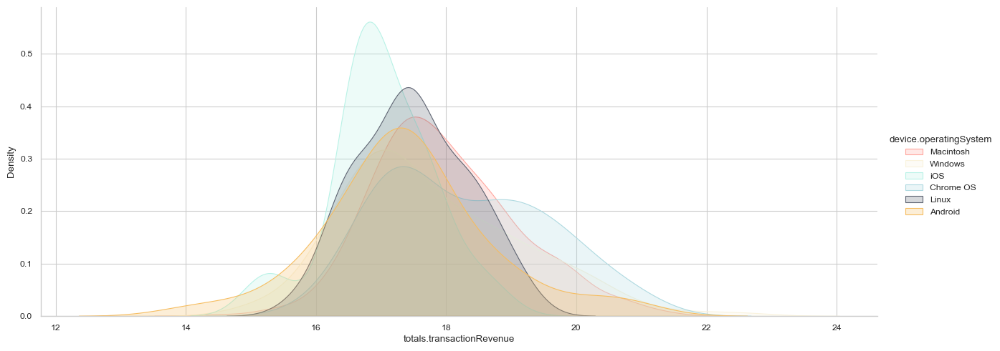

In [26]:
# Filter the DataFrame to include rows where 'device.operatingSystem' is in the top 6 operating systems
# with non-zero 'totals.transactionRevenue'
group = df_train[(df_train['device.operatingSystem'].isin(
    df_train[df_train['totals.transactionRevenue'] > 0]['device.operatingSystem'].value_counts().reset_index()[:6]['device.operatingSystem']
)) & (df_train['totals.transactionRevenue'] > 0)]

# Create a FacetGrid for plotting
_ = sns.FacetGrid(group, hue='device.operatingSystem', height=5, aspect=2.5)\
    .map(sns.kdeplot, 'totals.transactionRevenue', shade=True)\
    .add_legend()


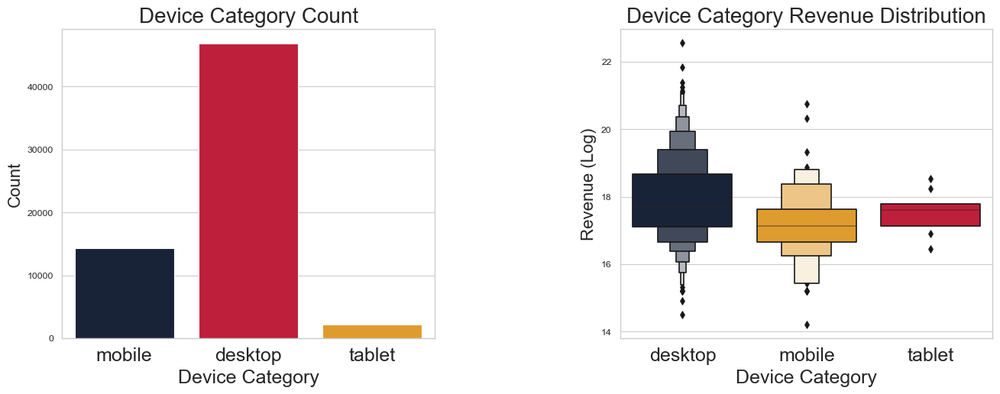

In [27]:
# Set the size of the figure
plt.figure(figsize=(14, 5))

# Create the first subplot on the left
plt.subplot(1, 2, 1)
# Create a count plot for 'device.deviceCategory'
sns.countplot(df_train, x="device.deviceCategory", palette=['#14213d', '#d90429', '#fca311'])
plt.title("Device Category Count", fontsize=20)
plt.xlabel("Device Category", fontsize=18)
plt.ylabel("Count", fontsize=16)
plt.xticks(fontsize=18)

# Create the second subplot on the right
plt.subplot(1, 2, 2)
# Create a boxen plot for 'totals.transactionRevenue' by 'device.deviceCategory'
sns.boxenplot(x="device.deviceCategory", y='totals.transactionRevenue',
              data=df_train[df_train['totals.transactionRevenue'] > 0], palette=['#14213d', '#fca311', '#d90429'])
plt.title("Device Category Revenue Distribution", fontsize=20)
plt.xlabel("Device Category", fontsize=18)
plt.ylabel("Revenue (Log)", fontsize=16)
plt.xticks(fontsize=18)

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.9, wspace=0.5)

# Show the plot
plt.show()


In [28]:
# Group the data by 'device.deviceCategory' and count the occurrences
group = df_train.groupby('device.deviceCategory').size().rename('Count').reset_index()

# Create a pie chart using Plotly Express
fig = px.pie(group,
             values='Count', names='device.deviceCategory',
             color_discrete_sequence=['#14213d', '#fca311', '#d90429'],
             title='Device Category',
             width=800,
             height=500)

# Update the layout of the pie chart
fig.update_layout(
    margin=dict(l=25, r=20, t=30, b=50),
    width=600,
    height=400,
    paper_bgcolor="#ffffff"
)

# Display the pie chart
fig.show()


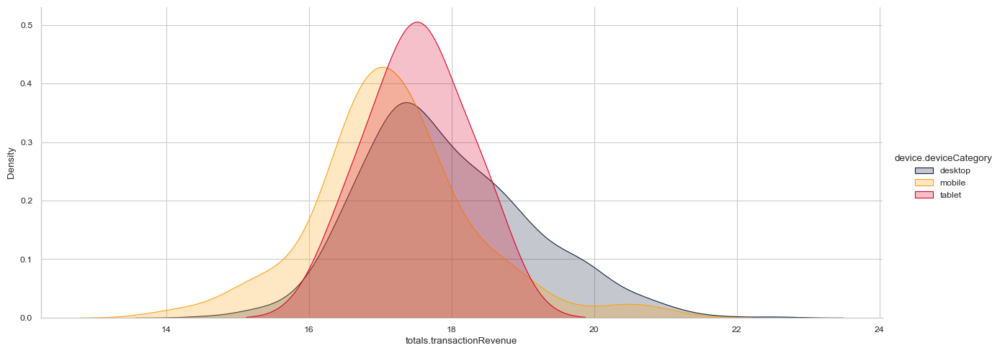

In [29]:
# Define a custom color palette
color = ['#14213d', '#fca311', '#d90429']

# Set the custom palette for Seaborn
customPalette = sns.set_palette(sns.color_palette(color))

# Create a FacetGrid for plotting
_ = sns.FacetGrid(df_train[df_train['totals.transactionRevenue'] > 0],
               hue='device.deviceCategory', height=5, aspect=2.5, palette=customPalette)\
    .map(sns.kdeplot, 'totals.transactionRevenue', shade=True)\
    .add_legend()


### For Different Continents

In [30]:
df_train['geoNetwork.continent'].value_counts().reset_index()

,geoNetwork.continent,count
0,Americas,31462
1,Asia,15744
2,Europe,13896
3,Oceania,1052
4,Africa,1029
5,(not set),99


### Daily Revenue

In [31]:
# Define a static color palette for use in the plot
color_op = ['#5527A0', '#BB93D7', '#834CF7', '#6C941E', '#93EAEA', '#7425FF', '#F2098A', '#7E87AC',
            '#EBE36F', '#7FD394', '#49C35D', '#3058EE', '#44FDCF', '#A38F85', '#C4CEE0', '#B63A05',
            '#4856BF', '#F0DB1B', '#9FDBD9', '#B123AC']

# Count the number of visits by date
dates_temp = df_train['date'].value_counts().reset_index().sort_values('date')
# Rename the columns
dates_temp.columns = ['date', 'visits']

# Create the first trace for visits by day
trace = go.Scatter(x=dates_temp.date.astype(str), y=dates_temp.visits,
                    opacity=0.8, line=dict(color='#38C788'), name='Visits by day')

# Calculate the total revenue by date
dates_temp_sum = df_train.groupby('date')['totals.transactionRevenue'].sum().reset_index()

# Create the second trace for revenue log by day
trace1 = go.Scatter(x=dates_temp_sum.date.astype(str), line=dict(color='#C73877'), name="RevenueLog by day",
                    y=dates_temp_sum['totals.transactionRevenue'], opacity=0.8)

# Calculate the total number of transactions by date
dates_temp_count = df_train[df_train['totals.transactionRevenue'] > 0].groupby('date')['totals.transactionRevenue'].count().reset_index()

# Create the third trace for sales by day
trace2 = go.Scatter(x=dates_temp_count.date.astype(str), line=dict(color=color_op[5]), name="Sellings by day",
                    y=dates_temp_count['totals.transactionRevenue'], opacity=0.8)

# Create layout options for the plot
layout = dict(
    title="Informations by Date",
    paper_bgcolor='#ffffff',
    template='plotly_white',
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1, label='1m', step='month', stepmode='backward'),
                dict(count=3, label='3m', step='month', stepmode='backward'),
                dict(count=6, label='6m', step='month', stepmode='backward'),
                dict(step='all')
            ])
        ),
        rangeslider=dict(visible=True),
        type='date'
    )
)

# Create a figure with the three traces and layout
fig = dict(data=[trace, trace1, trace2], layout=layout)

# Render the plot
iplot(fig)  # It's an equivalent to plt.show()


### Hour when the Revenue is high

In [32]:
# Create a cross-tabulation (crosstab) of 'visitHour' and 'weekday' columns with 'totals.transactionRevenue' as values
# The aggregation function used is 'sum', so it calculates the sum of transaction revenue for each combination of 'visitHour' and 'weekday'.
cross_tab = pd.crosstab(
    df_train['visitHour'],
    df_train['weekday'],
    values=df_train['totals.transactionRevenue'],
    aggfunc='sum'
)

# Apply a background gradient using the 'viridis' color map to the crosstab table
styled_table = cross_tab.style.background_gradient(cmap='viridis')


2pm to Midnight

In [33]:
def PieChart(df_colum, title, limit=15):
    # Group the data by the specified column and calculate the sum of 'totals.transactionRevenue'
    rev_trace = df_train.groupby(df_colum)["totals.transactionRevenue"].sum().nlargest(10).to_frame().reset_index()

    # Create a pie chart trace
    trace2 = go.Pie(
        labels=rev_trace[df_colum],
        values=rev_trace['totals.transactionRevenue'],
        name="% Revenue",
        hole=0.5,
        hoverinfo="label+percent+name",
        showlegend=True,
        domain={'x': [.52, 1]})

    # Define layout options for the pie chart
    layout = dict(
        title=title,
        height=450,
        font=dict(size=15),
        annotations=[
            dict(
                x=0.80, y=0.5,
                text='Revenue',
                showarrow=False,
                font=dict(size=20)
            )
        ])

    # Create a figure using the trace and layout
    fig = dict(data=[trace2], layout=layout)

    # Display the pie chart using Plotly
    iplot(fig)

In [34]:
PieChart("device.deviceCategory", "Device Category")

In [35]:
PieChart("geoNetwork.city", "Top Cities by Accesses and Revenue", limit=10)

In [36]:
PieChart("channelGrouping", "Channel Grouping Visits and Revenues")

In [37]:
# Count the number of visits per country and reset the column names
countMaps = pd.DataFrame(df_train['geoNetwork.country'].value_counts()).reset_index()
countMaps.columns = ['country', 'counts']

# Reset the index and drop the old index column
countMaps = countMaps.reset_index().drop('index', axis=1)

# Define the data for the choropleth map
data = [
    dict(
        type='choropleth',
        locations=countMaps['country'],
        locationmode='country names',
        z=countMaps['counts'],
        text=countMaps['country'],
        colorscale='YlGnBu',
        autocolorscale=False,
        marker=dict(
            line=dict(
                color='rgb(180,180,180)',
                width=0.5
            )
        ),
        colorbar=dict(
            autotick=False,
            tickprefix='',
            title='Number of Visits'
        )
    )
]

# Define the layout for the choropleth map
layout = dict(
    title='Counting Visits Per Country',
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection=dict(
            type='natural earth'
        )
    )
)

# Create a figure with the data and layout
figure = dict(data=data, layout=layout)

# Display the choropleth map using Plotly
iplot(figure, validate=False, filename='map-countrys-count')


In [38]:
# Group the data by 'geoNetwork.country' and calculate the sum of 'totals.transactionRevenue'
countMaps = df_train.groupby('geoNetwork.country')['totals.transactionRevenue'].sum().reset_index()
countMaps.columns = ['country', 'revenue']

# Reset the index and drop the old index column
countMaps = countMaps.reset_index().drop('index', axis=1)

# Define the data for the choropleth map
data = [
    dict(
        type='choropleth',
        locations=countMaps['country'],
        locationmode='country names',
        z=countMaps['revenue'],
        text=countMaps['country'],
        colorscale='Jet',
        autocolorscale=False,
        marker=dict(
            line=dict(
                color='rgb(180,180,180)',
                width=0.5
            )
        ),
        colorbar=dict(
            autotick=False,
            tickprefix='',
            title='Revenue'
        )
    )
]

# Define the layout for the choropleth map
layout = dict(
    title='Total Revenue Per Country',
    geo=dict(
        showframe=False,
        showcoastlines=True,
        projection=dict(
            type='natural earth'
        )
    )
)

# Create a figure with the data and layout
figure = dict(data=data, layout=layout)

# Display the choropleth map using Plotly
iplot(figure, validate=False, filename='map-countrys-count')

# Fitting a Model to the data

### Encoding Categorical Columns

In [39]:
# Import the LabelEncoder class from scikit-learn for encoding categorical variables
from sklearn.preprocessing import LabelEncoder

# Create a list of column names with data type 'object' (categorical columns)
cat_columns = list(df_train.dtypes[df_train.dtypes == 'object'].reset_index()['index'])

# Create a list of column names for numerical columns
num_columns = ["totals.hits", "totals.pageviews", "visitNumber", "visitStartTime", 'totals.bounces',  'totals.newVisits']

# Iterate through the categorical columns and apply label encoding to each
for col in cat_columns:
    df_train[col] = LabelEncoder().fit_transform(df_train[col])

# Create the feature matrix X, which includes both categorical and numerical columns
X = df_train[cat_columns + num_columns]

# Create the target variable y, which is 'totals.transactionRevenue'
y = df_train['totals.transactionRevenue']


### Model Building

In [37]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Split the data into training and testing sets (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

# Define hyperparameters for the LightGBM model
params = {
    "objective": "regression",           # Regression problem
    "metric": "rmse",                   # Root Mean Squared Error as the evaluation metric
    "num_leaves": 30,                   # Number of leaves in each tree
    "min_child_samples": 100,           # Minimum number of data points in a leaf
    "learning_rate": 0.01,             # Learning rate for gradient boosting
    "bagging_fraction": 0.8,            # Fraction of data to be randomly sampled during training
    "feature_fraction": 0.5,           # Fraction of features to be randomly sampled during training
    "bagging_frequency": 5,            # Frequency of bagging
    "bagging_seed": 2018,              # Seed for bagging randomness
    "verbosity": -1                    # Set verbosity to suppress non-error messages
}

# Create LightGBM datasets for training and testing
lgb_train = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
lgb_val = lgb.Dataset(X_test, label=y_test, free_raw_data=False)

# Train the LightGBM model using the defined parameters and datasets
model = lgb.train(params, lgb_train, num_boost_round=5000, valid_sets=[lgb_val])

# Make predictions on the test data using the trained model
y_pred = model.predict(X_test, num_iteration=model.best_iteration)

# Set negative predictions to zero (assuming revenue cannot be negative)
y_pred[y_pred < 0] = 0

# Create a DataFrame to compare predicted and actual revenue values
y_df = pd.DataFrame(data=y_pred, columns=['y_pred'])
y_df['y_test'] = y_test.values


In [38]:
# Set negative predictions to zero (assuming revenue cannot be negative)
y_pred[y_pred < 0] = 0

# Create a DataFrame to compare predicted and actual revenue values
y_df = pd.DataFrame(data=y_pred, columns=['y_pred'])
y_df['y_test'] = y_test.values

# Import the mean_squared_error function from scikit-learn
from sklearn.metrics import mean_squared_error

# Calculate the RMSE (Root Mean Squared Error)
rmse = np.sqrt(mean_squared_error(y_df['y_test'], y_df['y_pred']))

# The variable 'rmse' now contains the RMSE value


1.688784380111305

### Ensemble model using XGBoost, Catboost and Lightgbm

In [39]:
# Import necessary libraries
from sklearn.model_selection import train_test_split
import lightgbm as lgb
import xgboost as xgb
from catboost import CatBoostRegressor
import numpy as np
from sklearn.metrics import mean_squared_error

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

# Train and evaluate LightGBM model
lgb_params = {
    "objective": "regression",          # Regression problem
    "metric": "rmse",                  # Root Mean Squared Error as the evaluation metric
    "num_leaves": 30,                  # Number of leaves in each tree
    "min_child_samples": 100,          # Minimum number of data points in a leaf
    "learning_rate": 0.01,            # Learning rate for gradient boosting
    "bagging_fraction": 0.8,           # Fraction of data to be randomly sampled during training
    "feature_fraction": 0.5,          # Fraction of features to be randomly sampled during training
    "bagging_frequency": 5,           # Frequency of bagging
    "bagging_seed": 2018,             # Seed for bagging randomness
}

lgb_train = lgb.Dataset(X_train, label=y_train, free_raw_data=False)
lgb_model = lgb.train(lgb_params, lgb_train, num_boost_round=1000)
lgb_preds = lgb_model.predict(X_test)
lgb_preds[lgb_preds < 0] = 0
lgb_rmse = np.sqrt(mean_squared_error(y_test, lgb_preds))
print(f"LightGBM RMSE: {lgb_rmse}")

# Train and evaluate XGBoost model
xgb_params = {
    "objective": "reg:squarederror",  # Regression problem
    "max_depth": 6,                  # Maximum depth of the trees
    "learning_rate": 0.1,            # Learning rate for gradient boosting
    "subsample": 0.8,                # Fraction of data to be used for training each tree
    "colsample_bytree": 0.5,         # Fraction of features to be used for training each tree
}

xgb_model = xgb.XGBRegressor(n_estimators=1000, **xgb_params)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_test)
xgb_preds[xgb_preds < 0] = 0
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_preds))
print(f"XGBoost RMSE: {xgb_rmse}")

# Train and evaluate CatBoost model
catboost_params = {
    "iterations": 150,               # Number of iterations
    "learning_rate": 0.1,           # Learning rate for gradient boosting
    "depth": 6,                     # Depth of trees
    "loss_function": "RMSE",        # Loss function for regression
}

catboost_model = CatBoostRegressor(**catboost_params)
catboost_model.fit(X_train, y_train)
catboost_preds = catboost_model.predict(X_test)
catboost_preds[catboost_preds < 0] = 0
catboost_rmse = np.sqrt(mean_squared_error(y_test, catboost_preds))
print(f"CatBoost RMSE: {catboost_rmse}")


[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.003548 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1487
[LightGBM] [Info] Number of data points in the train set: 44297, number of used features: 20
[LightGBM] [Info] Start training from score 0.227192
LightGBM RMSE: 1.6778561099662106
XGBoost RMSE: 1.7973166459185899
0:	learn: 1.9510221	total: 175ms	remaining: 26.1s
1:	learn: 1.9047192	total: 188ms	remaining: 13.9s
2:	learn: 1.8637888	total: 201ms	remaining: 9.84s
3:	learn: 1.8300028	total: 214ms	remaining: 7.8s
4:	learn: 1.7997703	total: 224ms	remaining: 6.5s
5:	learn: 1.7758200	total: 234ms	remaining: 5.6s
6:	learn: 1.7549385	total: 243ms	remaining: 4.96s
7:	learn: 1.7381102	total: 254ms	remaining: 4.5s
8:	learn: 1.722

### Outputs

In [40]:
print(f"LightGBM RMSE: {lgb_rmse}")
print(f"XGBoost RMSE: {xgb_rmse}")
print(f"CatBoost RMSE: {catboost_rmse}")


LightGBM RMSE: 1.6778561099662106
XGBoost RMSE: 1.7973166459185899
CatBoost RMSE: 1.6854861043964025


[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Warning] Unknown parameter: bagging_frequency
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004081 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1487
[LightGBM] [Info] Number of data points in the train set: 44297, number of used features: 20
[10]	val's rmse: 1.98839
[20]	val's rmse: 1.95474
[30]	val's rmse: 1.93441
[40]	val's rmse: 1.90771
[50]	val's rmse: 1.87477
[60]	val's rmse: 1.85428
[70]	val's rmse: 1.83632
[80]	val's rmse: 1.82547
[90]	val's rmse: 1.8077
[100]	val's rmse: 1.79668
[110]	val's rmse: 1.78301
[120]	val's rmse: 1.7717
[130]	val's rmse: 1.76132
[140]	val's rmse: 1.75315
[150]	val's rmse: 1.74548
[160]	val's rmse: 1.73966
[170]	val'

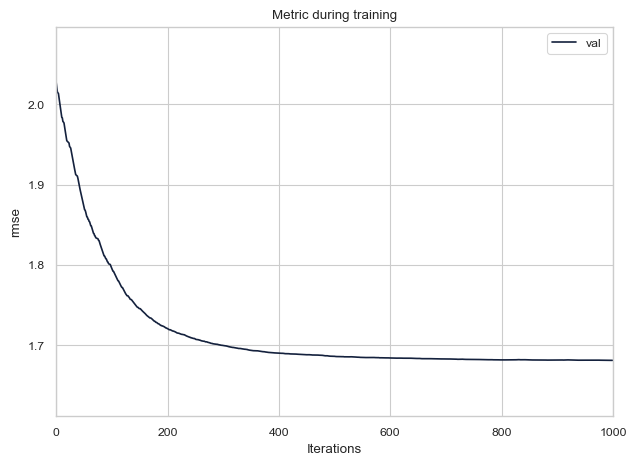

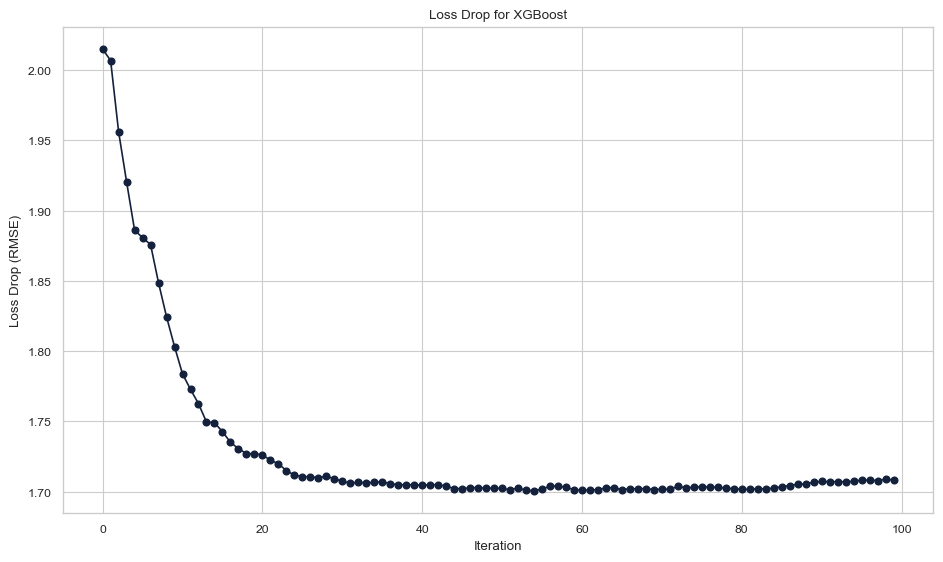

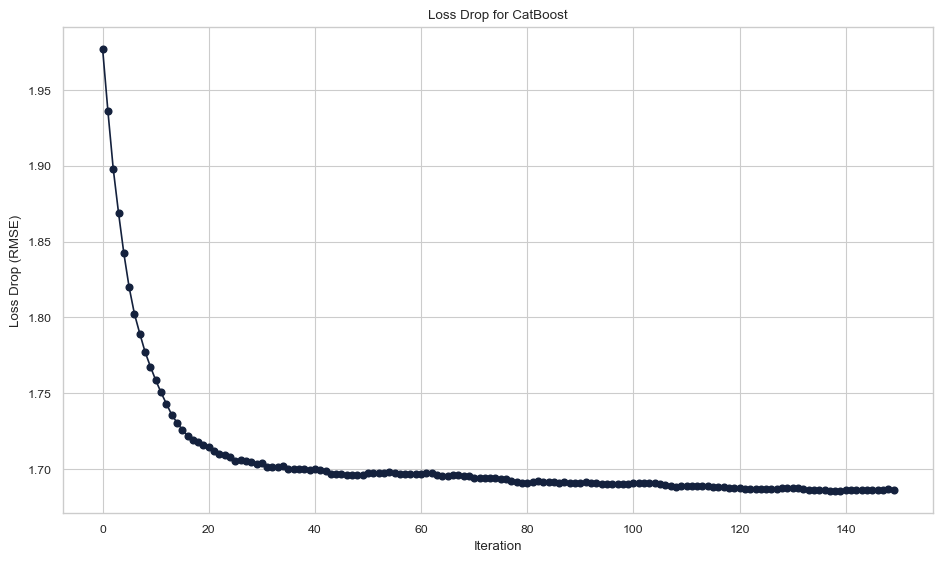

In [41]:
import matplotlib.pyplot as plt

# Create lists to store loss drop values for each model
loss_drops = []

# Train and evaluate LightGBM model
evals_result = {}
lgb_model = lgb.train(lgb_params, lgb_train, num_boost_round=1000, valid_sets=[lgb_val], valid_names=['val'], callbacks=[lgb.log_evaluation(10), lgb.record_evaluation(evals_result)])

# Plot loss drop for LightGBM
lgb.plot_metric(evals_result)  # This function plots metrics over boosting iterations

# Train and evaluate XGBoost model
xgb_loss_drops = []
xgb_model = xgb.XGBRegressor(n_estimators=100, **xgb_params)
xgb_model.fit(X_train, y_train, eval_set=[(X_test, y_test)], eval_metric="rmse", verbose=False)

# Collect loss drop values for XGBoost from evaluation results
for evals in xgb_model.evals_result().values():
    xgb_loss_drops.extend(evals['rmse'])

# Plot loss drop for XGBoost
plt.figure(figsize=(10, 6))
plt.plot(xgb_loss_drops, marker='o', linestyle='-')
plt.xlabel('Iteration')
plt.ylabel('Loss Drop (RMSE)')
plt.title('Loss Drop for XGBoost')
plt.grid(True)
plt.show()

# Train and evaluate CatBoost model
catboost_loss_drops = []
catboost_model = CatBoostRegressor(**catboost_params)
catboost_model.fit(X_train, y_train, eval_set=(X_test, y_test), use_best_model=True, verbose=0)

# Collect loss drop values for CatBoost from evaluation results
catboost_loss_drops.extend(catboost_model.get_evals_result()["validation"]["RMSE"])

# Plot loss drop for CatBoost
plt.figure(figsize=(10, 6))
plt.plot(catboost_loss_drops, marker='o', linestyle='-')
plt.xlabel('Iteration')
plt.ylabel('Loss Drop (RMSE)')
plt.title('Loss Drop for CatBoost')
plt.grid(True)
plt.show()


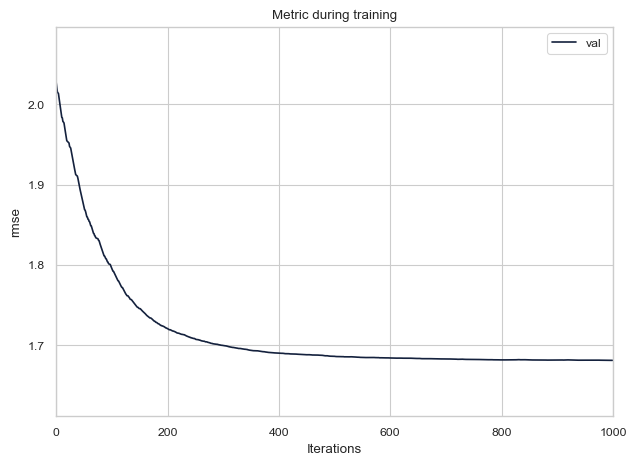

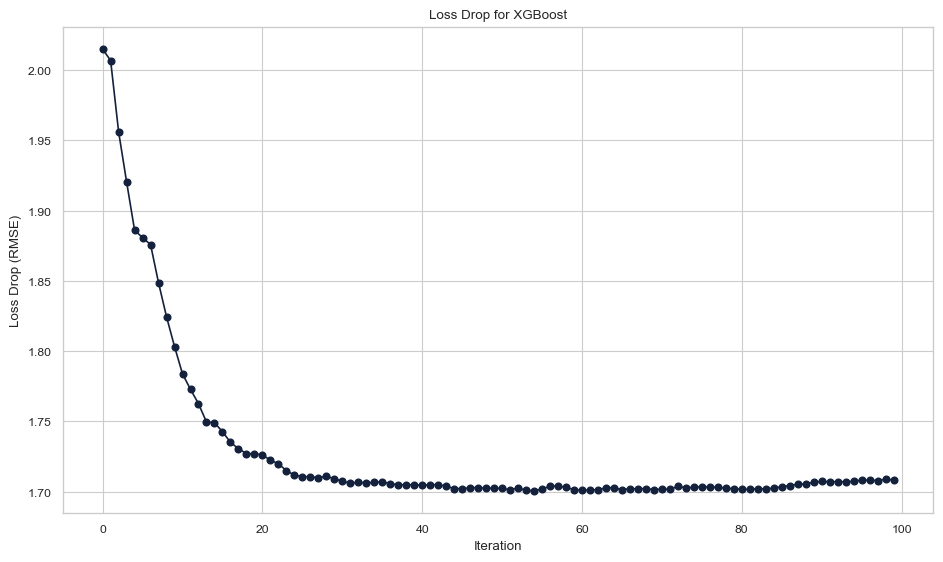

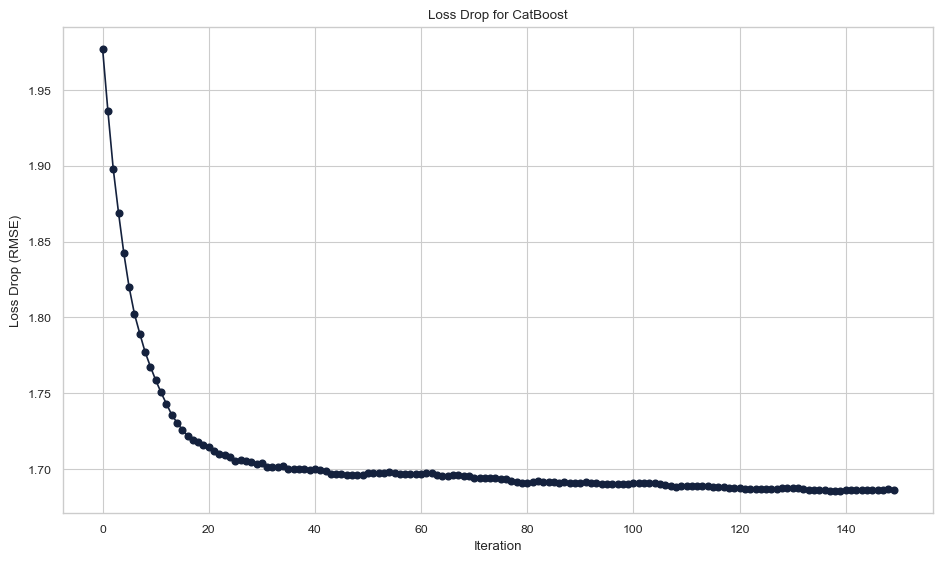

In [42]:
# Plot loss drop for LightGBM
lgb.plot_metric(evals_result)
# Plot loss drop for XGBoost
plt.figure(figsize=(10, 6))
plt.plot(xgb_loss_drops, marker='o', linestyle='-')
plt.xlabel('Iteration')
plt.ylabel('Loss Drop (RMSE)')
plt.title('Loss Drop for XGBoost')
plt.grid(True)
plt.show()


### Ensemble Model Outputs

In [43]:
# Ensemble the models
print(f"LightGBM RMSE: {lgb_rmse}")
print(f"XGBoost RMSE: {xgb_rmse}")
print(f"CatBoost RMSE: {catboost_rmse}")
ensemble_preds = 0.7 * lgb_preds + 0.25 * catboost_preds + 0.0 * xgb_preds
ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_preds))
print(f"Ensemble RMSE: {ensemble_rmse}")

LightGBM RMSE: 1.6778561099662106
XGBoost RMSE: 1.7973166459185899
CatBoost RMSE: 1.6854861043964025
Ensemble RMSE: 1.6770031754251973


### Regression Report

In [44]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import explained_variance_score, median_absolute_error


# Calculate predictions
y_pred = model.predict(X_test, num_iteration=model.best_iteration)
y_pred[y_pred < 0] = 0

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_df['y_test'], y_df['y_pred']))

# Calculate R-squared (R2)
r2 = r2_score(y_df['y_test'], y_df['y_pred'])

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_df['y_test'], y_df['y_pred'])

# Calculate Explained Variance Score
explained_variance = explained_variance_score(y_df['y_test'], y_df['y_pred'])

# Calculate Median Absolute Error
median_absolute = median_absolute_error(y_df['y_test'], y_df['y_pred'])

# Create a regression report
report = f"Root Mean Squared Error (RMSE): {rmse}\n"
report += f"R-squared (R2): {r2}\n"
report += f"Mean Absolute Error (MAE): {mae}\n"
report += f"Explained Variance: {explained_variance}\n"
report += f"Median Absolute Error: {median_absolute}\n"

# Print the regression report
print(report)


Root Mean Squared Error (RMSE): 1.688784380111305
R-squared (R2): 0.3064329840324732
Mean Absolute Error (MAE): 0.3401801396175546
Explained Variance: 0.30671694539672223
Median Absolute Error: 0.0



# Hyperparameter Tuning LightGBM

### Grid Search

In [45]:
from sklearn.model_selection import GridSearchCV

param_grid = {
"num_leaves": [20, 30, 40],
"learning_rate": [0.01, 0.05, 0.1],
"bagging_fraction": [0.7, 0.8, 0.9],
}

# Set LightGBM verbosity to 1 (or any level you prefer)
lgb_model = lgb.LGBMRegressor(objective="regression", metric="rmse", bagging_seed=2018)

grid_search = GridSearchCV(estimator=lgb_model, param_grid=param_grid, cv=3, scoring="neg_mean_squared_error")
grid_search.fit(X_train, y_train)


[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014463 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1415
[LightGBM] [Info] Number of data points in the train set: 29531, number of used features: 20
[LightGBM] [Info] Start training from score 0.231394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM

GridSearchCV(cv=3,
             estimator=LGBMRegressor(bagging_seed=2018, metric='rmse',
                                     objective='regression'),
             param_grid={'bagging_fraction': [0.7, 0.8, 0.9],
                         'learning_rate': [0.01, 0.05, 0.1],
                         'num_leaves': [20, 30, 40]},
             scoring='neg_mean_squared_error')

### Ouptut after tuning

In [46]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)
# Print RMSE value
print("RMSE:", np.sqrt(-grid_search.best_score_))

Best Hyperparameters: {'bagging_fraction': 0.7, 'learning_rate': 0.05, 'num_leaves': 20}
RMSE: 1.6882309617267086


### Randomized Search

In [47]:
from sklearn.model_selection import RandomizedSearchCV

# Define the hyperparameter grid
param_grid = {
    "num_leaves": [20, 30, 40],
    "learning_rate": [0.01, 0.05, 0.1],
    "bagging_fraction": [0.7, 0.8, 0.9],
    "feature_fraction": [0.5, 0.7, 0.8],
    "min_child_samples": [20, 50, 100],
}

# Create the LightGBM model
lgb_model = lgb.LGBMRegressor(objective="regression", metric="rmse", bagging_seed=2018)

# Randomized Search with cross-validation
random_search = RandomizedSearchCV(
    estimator=lgb_model,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring="neg_mean_squared_error",
    cv=3,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,
    random_state=42
)

# Perform the search
random_search.fit(X_train, y_train)

# Train the model with the best hyperparameters
best_model = lgb.train(params, lgb_train, num_boost_round=1000, valid_sets=[lgb_val])

# Make predictions
y_pred = best_model.predict(X_test, num_iteration=best_model.best_iteration)
y_pred[y_pred < 0] = 0


Fitting 3 folds for each of 50 candidates, totalling 150 fits
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005767 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1487
[LightGBM] [Info] Number of data points in the train set: 44297, number of used features: 20
[LightGBM] [Info] Start training from score 0.227192
[LightGBM] [Warning] Unknown parameter: bagging_fr

### Ouput after Tuning

In [48]:
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE : {rmse}")

Best Hyperparameters: {'num_leaves': 30, 'min_child_samples': 100, 'learning_rate': 0.05, 'feature_fraction': 0.8, 'bagging_fraction': 0.9}
RMSE : 1.6778561099662106


### Error

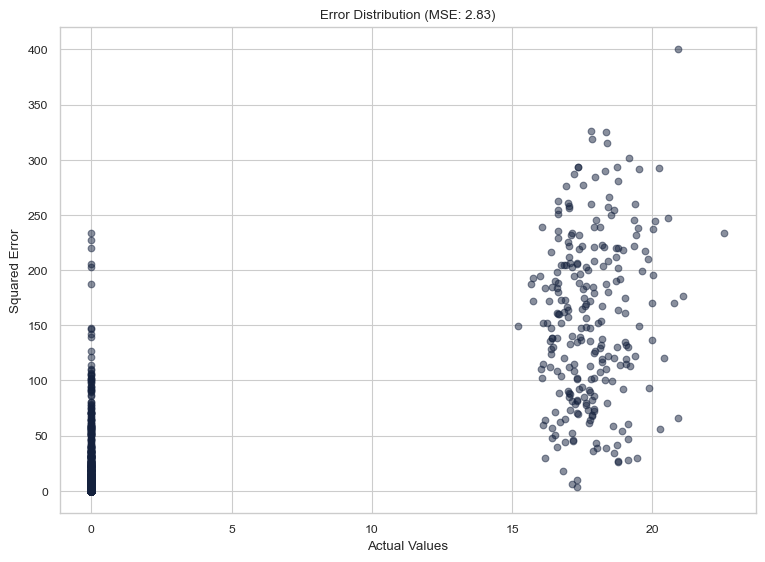

In [49]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Calculate and store the predictions of the XGBoost model with the best hyperparameters on the test data
y_pred = best_model.predict(X_test)

# Calculate the error (squared error in this case)
errors = (y_test - y_pred) ** 2

# Calculate the mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Plot the errors
plt.figure(figsize=(8, 6))
plt.scatter(y_test, errors, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Squared Error')
plt.title(f'Error Distribution (MSE: {mse:.2f})')
plt.show()

### Feature and Residual Plots Visualisation

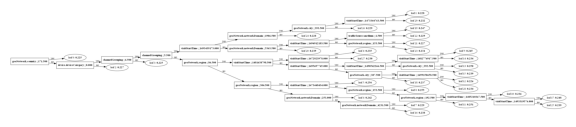

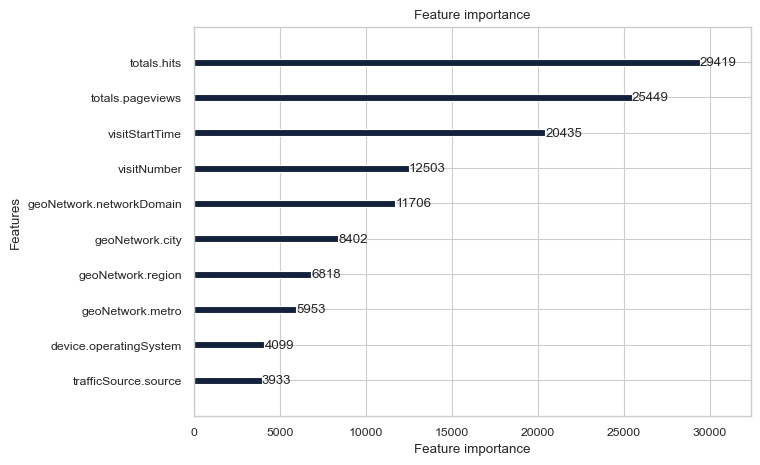

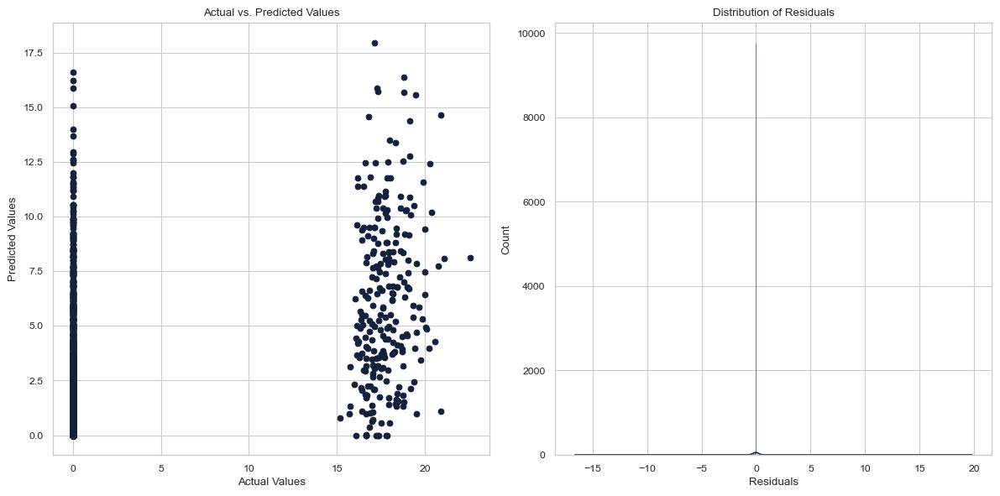

In [50]:
# Error/loss visualization
lgb.plot_tree(model)
plt.show()

# Feature importance visualization
lgb.plot_importance(model, max_num_features=10)
plt.show()

# Additional plots and visualizations
plt.figure(figsize=(12, 6))

# Scatter plot of actual vs. predicted values
plt.subplot(1, 2, 1)
plt.scatter(y_df['y_test'], y_df['y_pred'])
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")

# Distribution plot of residuals
residuals = y_df['y_test'] - y_df['y_pred']
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.title("Distribution of Residuals")

plt.tight_layout()
plt.show()

## Hyperparameter Tuning for XGBoost

### Grid Search

In [51]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}
grid_search = GridSearchCV(
    estimator=xgb.XGBRegressor(),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Use an appropriate metric
    cv=5,  # Cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
)
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 0.9, 1.0],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0]},
             scoring='neg_mean_squared_error')

### Output after Tuning

In [52]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)
# Print RMSE value
print("RMSE:", np.sqrt(-grid_search.best_score_))

Best Hyperparameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 300, 'subsample': 0.9}
RMSE: 1.6666543525026052


### Randomized Search

In [53]:
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb
import numpy as np

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.5, 0.7, 0.8],
}

# Create the XGBoost model
xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=2018)

# Randomized Search with cross-validation
random_search = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_squared_error',
    cv=3,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,
    random_state=42
)

# Perform the search
random_search.fit(X_train, y_train)

# Train the model with the best hyperparameters
best_xgb_model = xgb.XGBRegressor(objective='reg:squarederror', **best_params)
best_xgb_model.fit(X_train, y_train)

# Make predictions
y_pred = best_xgb_model.predict(X_test)
y_pred[y_pred < 0] = 0


Fitting 3 folds for each of 50 candidates, totalling 150 fits


### Output after Tuning 

In [54]:
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE : {rmse}")

Best Hyperparameters: {'subsample': 0.9, 'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.05, 'colsample_bytree': 0.8}
RMSE : 1.700744668662872


### Featured and Residual Plots Visualisation

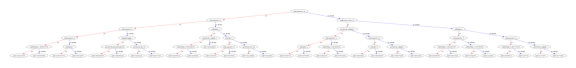

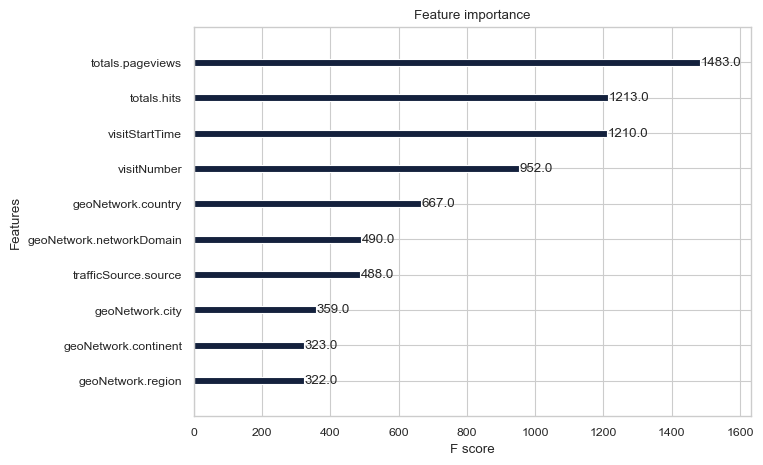

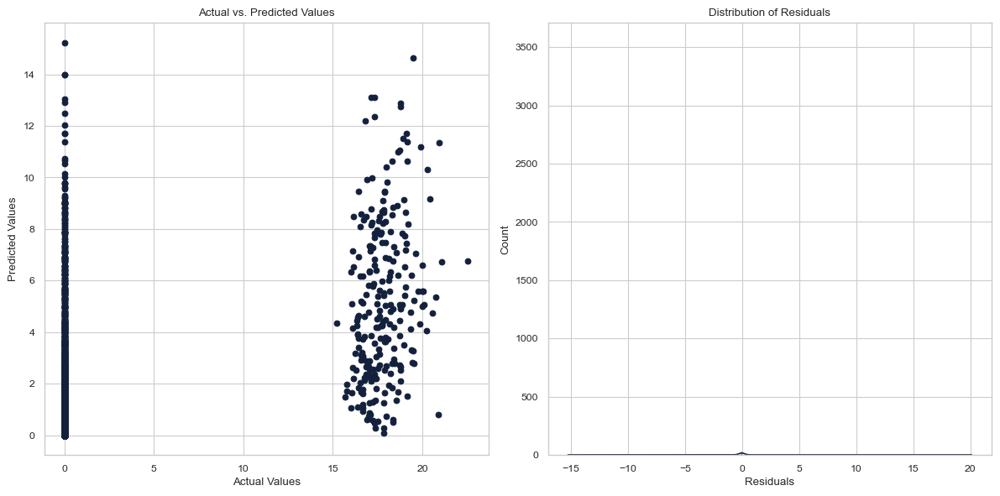

In [55]:
xgb.plot_tree(best_xgb_model)
plt.show()

# Feature importance visualization
xgb.plot_importance(best_xgb_model, max_num_features=10)
plt.show()

# Additional plots and visualizations
plt.figure(figsize=(12, 6))

# Scatter plot of actual vs. predicted values
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")

# Distribution plot of residuals
residuals = y_test - y_pred
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.title("Distribution of Residuals")

plt.tight_layout()
plt.show()

### Error

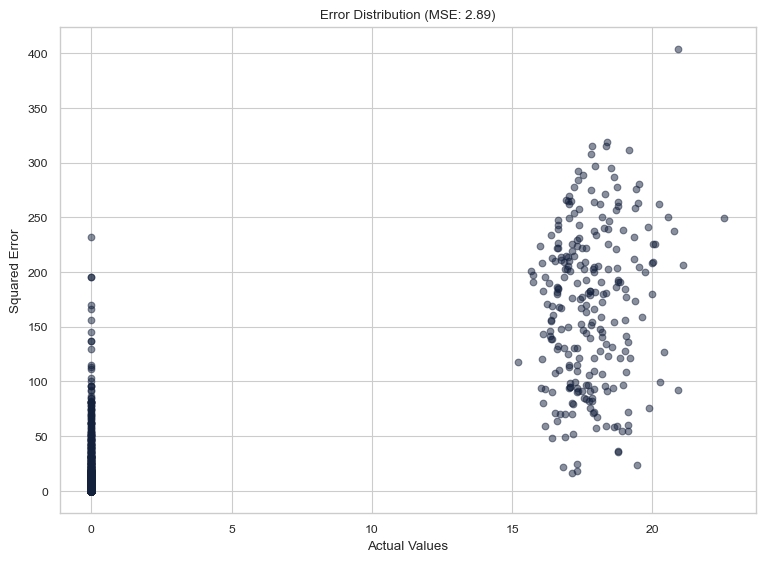

In [56]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Calculate and store the predictions of the XGBoost model with the best hyperparameters on the test data
y_pred = best_xgb_model.predict(X_test)

# Calculate the error (squared error in this case)
errors = (y_test - y_pred) ** 2

# Calculate the mean squared error (MSE)
mse = mean_squared_error(y_test, y_pred)

# Plot the errors
plt.figure(figsize=(8, 6))
plt.scatter(y_test, errors, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Squared Error')
plt.title(f'Error Distribution (MSE: {mse:.2f})')
plt.show()


## Hyperparameter Tuning for Catboost

### Grid Search 

In [57]:
from catboost import CatBoostRegressor, Pool, cv
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Define the hyperparameter grid
param_grid = {
    'iterations': [100, 200, 300],
    'depth': [3, 4, 5],
    'learning_rate': [0.01, 0.1, 0.2],
    'bagging_temperature': [0.8, 0.9, 1.0],
}

# Create the CatBoost model
catboost_model = CatBoostRegressor(loss_function='RMSE', verbose=0)

# Grid Search with cross-validation
grid_search = GridSearchCV(
    estimator=catboost_model,
    param_grid=param_grid,
    scoring='neg_mean_squared_error',  # Use an appropriate metric
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
)

# Perform the search
grid_search.fit(X_train, y_train)
best_params = grid_search.best_params_

# Train the model with the best hyperparameters
best_catboost_model_grid = CatBoostRegressor(loss_function='RMSE', verbose=0)
best_catboost_model_grid.set_params(**best_params)
best_catboost_model_grid.fit(X_train, y_train)

# Make predictions
y_pred = best_catboost_model_grid.predict(X_test)
y_pred[y_pred < 0] = 0


### Output after tuning 

In [58]:
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)
# Print RMSE value
print("RMSE:", np.sqrt(-grid_search.best_score_))

Best Hyperparameters: {'bagging_temperature': 0.8, 'depth': 4, 'iterations': 100, 'learning_rate': 0.1}
RMSE: 1.6698446353689274


### Randomized Search

In [59]:
# Define the hyperparameter grid
param_grid = {
    'iterations': [100, 200, 300],
    'depth': [3, 4, 5],
    'learning_rate': [0.01, 0.05, 0.1],
    'bagging_temperature': [0.7, 0.8, 0.9],
}

# Create the CatBoost model
catboost_model = CatBoostRegressor(loss_function='RMSE', verbose=0)

# Randomized Search with cross-validation
random_search = RandomizedSearchCV(
    estimator=catboost_model,
    param_distributions=param_grid,
    n_iter=50,  # Number of random combinations to try
    scoring='neg_mean_squared_error',
    cv=3,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores
    verbose=2,
    random_state=42
)

# Perform the search
random_search.fit(X_train, y_train)
best_params = random_search.best_params_

# Train the model with the best hyperparameters
best_catboost_model = CatBoostRegressor(loss_function='RMSE', verbose=0, **best_params)
best_catboost_model.fit(X_train, y_train)

# Make predictions
y_pred = best_catboost_model.predict(X_test)
y_pred[y_pred < 0] = 0


Fitting 3 folds for each of 50 candidates, totalling 150 fits


### Output after Tuning

In [60]:
best_params = random_search.best_params_
print("Best Hyperparameters:", best_params)
# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE : {rmse}")

Best Hyperparameters: {'learning_rate': 0.1, 'iterations': 100, 'depth': 4, 'bagging_temperature': 0.8}
RMSE : 1.6958059257371452


### Error

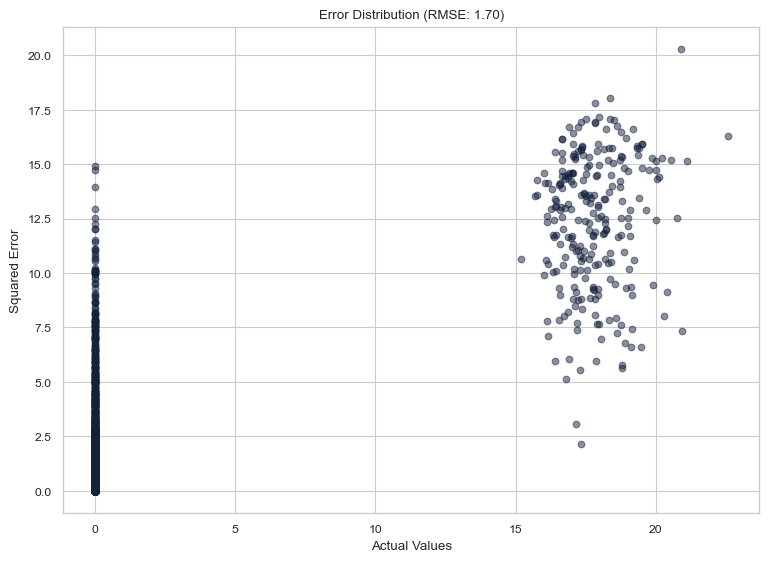

In [61]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error

# Calculate and store the predictions of the XGBoost model with the best hyperparameters on the test data
y_pred = best_catboost_model.predict(X_test)

# Calculate the error (squared error in this case)
errors = np.sqrt((y_test - y_pred) ** 2)

# Calculate the mean squared error (MSE)
mse = np.sqrt(mean_squared_error(y_test, y_pred))

# Plot the errors
plt.figure(figsize=(8, 6))
plt.scatter(y_test, errors, alpha=0.5)
plt.xlabel('Actual Values')
plt.ylabel('Squared Error')
plt.title(f'Error Distribution (RMSE: {mse:.2f})')
plt.show()


### Featured and Residual Plots Visualisation

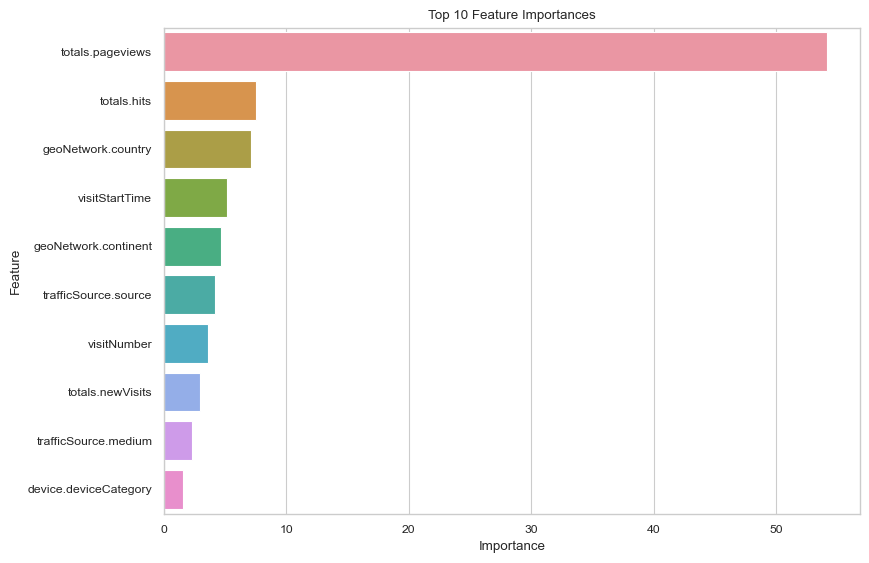

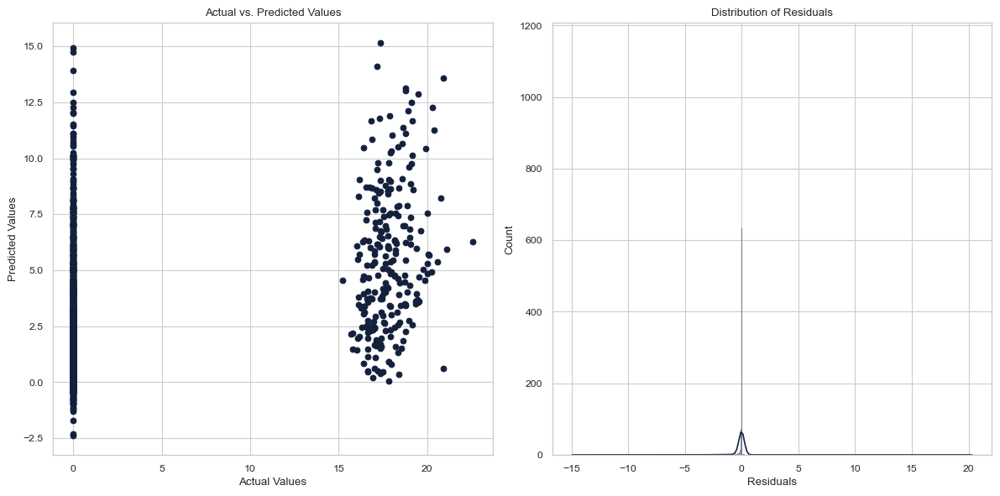

In [62]:
# Visualize CatBoost trees
best_catboost_model.plot_tree(tree_idx=0, pool=Pool(X_test))

plt.show()

# Feature importance visualization
feature_importance = best_catboost_model.get_feature_importance(Pool(X_test))
feature_names = X_test.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
plt.figure(figsize=(8, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(10))
plt.title("Top 10 Feature Importances")
plt.show()

# Additional plots and visualizations
plt.figure(figsize=(12, 6))

# Scatter plot of actual vs. predicted values
plt.subplot(1, 2, 1)
plt.scatter(y_test, y_pred)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs. Predicted Values")

# Distribution plot of residuals
residuals = y_test - y_pred
plt.subplot(1, 2, 2)
sns.histplot(residuals, kde=True)
plt.xlabel("Residuals")
plt.title("Distribution of Residuals")

plt.tight_layout()
plt.show()


### Ensemble Model

In [63]:
# Train and evaluate LightGBM model
lgb_params = {
    "objective": "regression",
    "metric": "rmse",
    "max_depth": 5,                 # Updated max_depth
    "n_estimators": 100,             # Updated n_estimators
    "learning_rate": 0.01,
    "subsample": 0.9,               # Updated subsample
    "colsample_bytree": 0.8,       # Updated colsample_bytree
}

lgb_model = lgb.LGBMRegressor(**lgb_params)
lgb_model.fit(X_train, y_train)
lgb_preds = best_model.predict(X_test)
lgb_rmse = np.sqrt(mean_squared_error(y_test, lgb_preds))
print(f"LightGBM RMSE: {lgb_rmse}")

# Train and evaluate XGBoost model
xgb_params = {
    "objective": "reg:squarederror",
    "max_depth": 5,                 # Updated max_depth
    "n_estimators": 80,            # Updated n_estimators
    "learning_rate": 0.05,         # Updated learning_rate
    "subsample": 0.9,              # Updated subsample
    "colsample_bytree": 0.8,      # Updated colsample_bytree
}

xgb_model = xgb.XGBRegressor(**xgb_params)
best_xgb_model.fit(X_train, y_train)
xgb_preds = best_xgb_model.predict(X_test)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_preds))
print(f"XGBoost RMSE: {xgb_rmse}")

# Train and evaluate CatBoost model
catboost_params = {
    "iterations": 500,             # Updated iterations
    "learning_rate": 0.1,          # Updated learning_rate
    "depth": 4,                    # Updated depth
    "loss_function": "RMSE",
    "bagging_temperature": 0.8,    # Added bagging_temperature
}

catboost_model = CatBoostRegressor(**catboost_params)
best_catboost_model_grid.fit(X_train, y_train)
catboost_preds = best_catboost_model_grid.predict(X_test)
catboost_rmse = np.sqrt(mean_squared_error(y_test, catboost_preds))
print(f"CatBoost RMSE: {catboost_rmse}")

# Create an ensemble model
ensemble_preds = (lgb_preds + xgb_preds + catboost_preds) / 3
ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_preds))
print(f"Ensemble RMSE: {ensemble_rmse}")


[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005115 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1487
[LightGBM] [Info] Number of data points in the train set: 44297, number of used features: 20
[LightGBM] [Info] Start training from score 0.227192
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

### Ensemble Model Outputs

In [64]:
# Ensemble the models
print(f"LightGBM RMSE: {lgb_rmse}")
print(f"XGBoost RMSE: {xgb_rmse}")
print(f"CatBoost RMSE: {catboost_rmse}")
ensemble_preds = 0.7 * lgb_preds + 0.25 * catboost_preds + 0.05 * xgb_preds
ensemble_rmse = np.sqrt(mean_squared_error(y_test, ensemble_preds))
print(f"Ensemble RMSE: {ensemble_rmse}")

LightGBM RMSE: 1.6809121598111167
XGBoost RMSE: 1.7008248292170514
CatBoost RMSE: 1.6964184600649084
Ensemble RMSE: 1.6805581811786217


In [65]:
y_pred[y_pred < 0] = 0
y_df = pd.DataFrame(data=y_pred, columns=['y_pred'])
y_df['y_test'] = y_test.values


from sklearn.metrics import mean_squared_error

np.sqrt(mean_squared_error(y_df['y_test'],y_df['y_pred']))

1.6958059257371452

### Regression Report

In [66]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import explained_variance_score, median_absolute_error


# Calculate predictions
y_pred = model.predict(X_test, num_iteration=model.best_iteration)
y_pred[y_pred < 0] = 0

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_df['y_test'], y_df['y_pred']))

# Calculate R-squared (R2)
r2 = r2_score(y_df['y_test'], y_df['y_pred'])

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_df['y_test'], y_df['y_pred'])

# Calculate Explained Variance Score
explained_variance = explained_variance_score(y_df['y_test'], y_df['y_pred'])

# Calculate Median Absolute Error
median_absolute = median_absolute_error(y_df['y_test'], y_df['y_pred'])

# Create a regression report
report = f"Root Mean Squared Error (RMSE): {rmse}\n"
report += f"R-squared (R2): {r2}\n"
report += f"Mean Absolute Error (MAE): {mae}\n"
report += f"Explained Variance: {explained_variance}\n"
report += f"Median Absolute Error: {median_absolute}\n"

# Print the regression report
print(report)


Root Mean Squared Error (RMSE): 1.6958059257371452
R-squared (R2): 0.3006536359436105
Mean Absolute Error (MAE): 0.3274207342425582
Explained Variance: 0.30065525740270493
Median Absolute Error: 0.0008653643431106028



### Comparision of RMSE

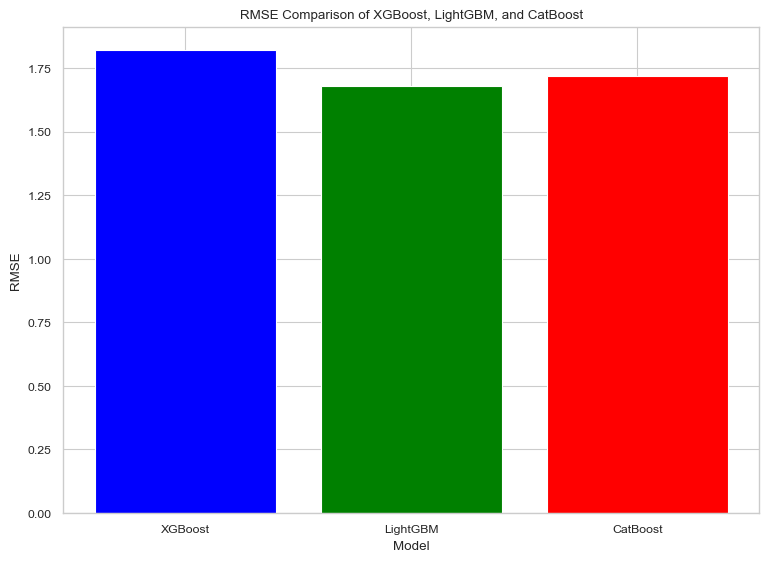

In [67]:
import matplotlib.pyplot as plt

models = ['XGBoost', 'LightGBM', 'CatBoost']
rmse_values = [1.8207197971083897, 1.6809121598111167, 1.720037693359567]

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(models, rmse_values, color=['blue', 'green', 'red'])
plt.xlabel('Model')
plt.ylabel('RMSE')
plt.title('RMSE Comparison of XGBoost, LightGBM, and CatBoost')
plt.show()

### Comparision using Radar Graph

In [68]:
import plotly.express as px
import pandas as pd
models = ['XGBoost', 'LightGBM', 'CatBoost']
rmse_values = [1.8207197971083897, 1.6809121598111167, 1.720037693359567]

# Create a DataFrame
data = {
    'Model': models,
    'RMSE': rmse_values,
}

df = pd.DataFrame(data)

# Create the radar chart
fig = px.line_polar(df, r='RMSE', theta='Model', line_close=True)
fig.show()

### Loss Drop

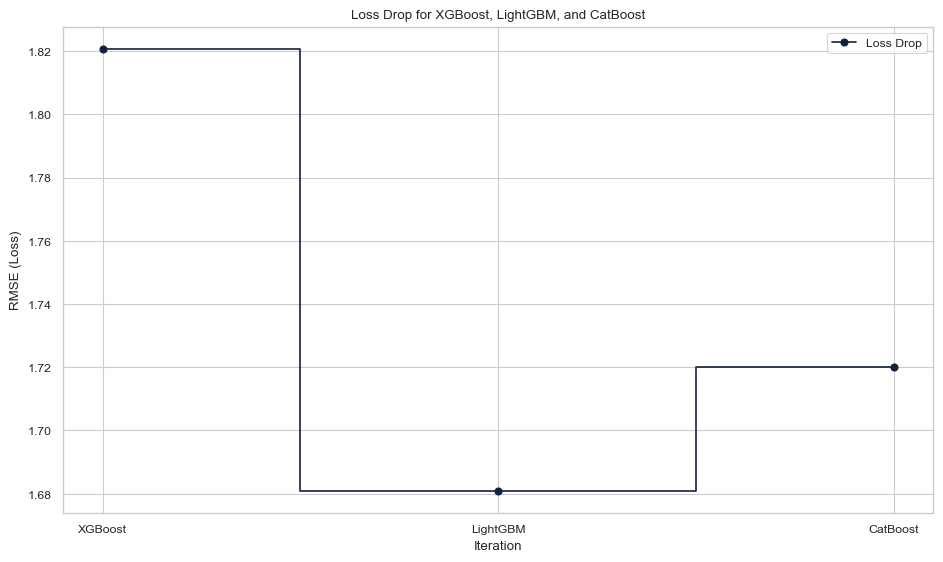

In [69]:
import matplotlib.pyplot as plt

# Sample RMSE values (replace with your actual data)
models = ['XGBoost', 'LightGBM', 'CatBoost']
rmse_values = [1.8207197971083897, 1.6809121598111167, 1.720037693359567]

# Create a list of iterations
iterations = list(range(1, len(rmse_values) + 1))

# Create a loss drop plot
plt.figure(figsize=(10, 6))
plt.step(iterations, rmse_values, where='mid', label='Loss Drop', marker='o')
plt.xlabel('Iteration')
plt.ylabel('RMSE (Loss)')
plt.title('Loss Drop for XGBoost, LightGBM, and CatBoost')
plt.xticks(iterations, models)  # Set model names as x-axis labels
plt.grid(True)
plt.legend()
plt.show()

### Loss Plot

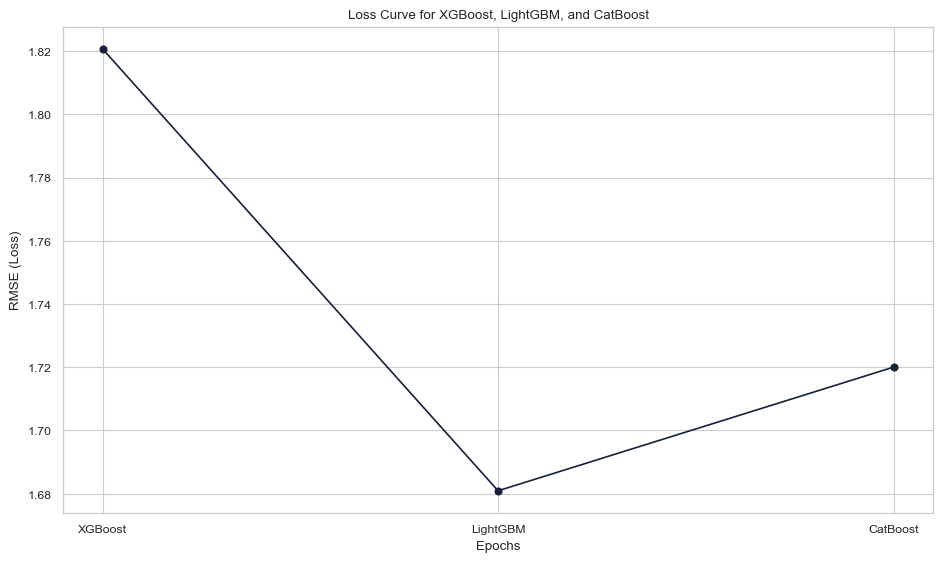

In [70]:
import matplotlib.pyplot as plt
import numpy as np

models = ['XGBoost', 'LightGBM', 'CatBoost']
rmse_values = [1.8207197971083897, 1.6809121598111167, 1.720037693359567]

# Create an array representing the training iterations (epochs)
epochs = np.arange(1, len(rmse_values) + 1)

# Create a loss curve plot
plt.figure(figsize=(10, 6))
plt.plot(epochs, rmse_values, marker='o', linestyle='-')
plt.xlabel('Epochs')
plt.ylabel('RMSE (Loss)')
plt.title('Loss Curve for XGBoost, LightGBM, and CatBoost')
plt.xticks(epochs, models)  # Set model names as x-axis labels
plt.grid(True)
plt.show()

In [40]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, LabelEncoder


scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
y_enc = LabelEncoder().fit_transform(y)
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_enc, test_size=0.2, random_state=42)


# Create and train the Naive Bayes classifier
clf = GaussianNB()
clf.fit(X_train, y_train)

# Make predictions on the test set
y_pred = clf.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.60


In [ ]:
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.metrics import mean_squared_error
import numpy as np

# Define your kernel
kernel = C(1.0, (1e-3, 1e3)) * RBF(1.0, (1e-2, 1e2))
model = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10)

# Assuming X_train_batch and X_test_batch are NumPy arrays
batch_size = 100

# Train the model on one batch
X_train_batch = X_train[:batch_size]
y_train_batch = y_train[:batch_size]
model.fit(X_train_batch, y_train_batch)

# Predict on the test batch
X_test_batch = X_test[:batch_size]
y_pred_batch, sigma_batch = model.predict(X_test_batch, return_std=True)

# Calculate Mean Squared Error
mse_batch = mean_squared_error(y_test[:batch_size], y_pred_batch)
print(f"Mean Squared Error : {mse_batch:.4f}")


Mean Squared Error : 36.0000


In [ ]:
from sklearn.linear_model import BayesianRidge

model = BayesianRidge()

model.fit(X_train, y_train)
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.4f}")

Mean Squared Error: 920.8161


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import BayesianRidge
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

# Assuming X and y are your feature matrix and target variable
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_enc, test_size=0.2, random_state=42)

# Train individual models
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train, y_train)
knn_pred = knn_model.predict(X_test)
knn_mse = np.sqrt(mean_squared_error(y_test, knn_pred))

br_model = BayesianRidge()
br_model.fit(X_train, y_train)
br_pred = br_model.predict(X_test)
br_mse = np.sqrt(mean_squared_error(y_test, br_pred))

# Gaussian Naive Bayes does not have a predict_proba method
# Using the decision function to obtain confidence scores
gnb_model = GaussianNB()
gnb_model.fit(X_train, y_train)
gnb_confidence = gnb_model.predict_proba(X_test)
gnb_mse = np.sqrt(mean_squared_error(y_test, np.max(gnb_confidence, axis=1)))

# Determine weights based on performance (lower MSE gets higher weight)
total_mse_knn_br = knn_mse + br_mse
knn_weight = 1 - knn_mse / total_mse_knn_br
br_weight = 1 - br_mse / total_mse_knn_br

total_mse_gnb = gnb_mse
gnb_weight = 1 - gnb_mse / total_mse_gnb

# Create an ensemble model with weighted predictions for KNN and Bayesian Ridge
ensemble_model = VotingRegressor(estimators=[
    ('knn', knn_model),
    ('br', br_model)
], weights=[knn_weight, br_weight])

ensemble_model.fit(X_train, y_train)
ensemble_pred = ensemble_model.predict(X_test)
ensemble_mse = np.sqrt(mean_squared_error(y_test, ensemble_pred))

print(f"KNN MSE: {knn_mse:.4f}")
print(f"Bayesian Ridge MSE: {br_mse:.4f}")
print(f"Gaussian NB MSE: {gnb_mse:.4f}")
print(f"Ensemble (KNN + Bayesian Ridge) MSE: {ensemble_mse:.4f}")


KNN MSE: 30.9244
Bayesian Ridge MSE: 30.3450
Gaussian NB MSE: 33.1803
Ensemble (KNN + Bayesian Ridge) MSE: 29.2842


In [ ]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Assuming X and y are your feature matrix and target variable
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_enc, test_size=0.2, random_state=42)

# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Apply PCA
pca = PCA(n_components=10)  # Adjust the number of components as needed
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

# Apply LDA
lda = LinearDiscriminantAnalysis(n_components=1)  # Adjust the number of components as needed
X_train_lda = lda.fit_transform(X_train_scaled, y_train)
X_test_lda = lda.transform(X_test_scaled)

# Train individual models
knn_model = KNeighborsRegressor(n_neighbors=5)
knn_model.fit(X_train_pca, y_train)
knn_pred = knn_model.predict(X_test_pca)
knn_mse = np.sqrt(mean_squared_error(y_test, knn_pred))

br_model = BayesianRidge()
br_model.fit(X_train_lda, y_train)
br_pred = br_model.predict(X_test_lda)
br_mse = np.sqrt(mean_squared_error(y_test, br_pred))

gnb_model = GaussianNB()
gnb_model.fit(X_train_scaled, y_train)
gnb_pred = gnb_model.predict_proba(X_test_scaled)[:, 1]  # Using probability estimates
gnb_mse = np.sqrt(mean_squared_error(y_test, gnb_pred))

# Create an ensemble model with PCA, LDA, and GNB
ensemble_model = VotingRegressor(estimators=[
    ('knn', knn_model),
    ('br', br_model),
])

ensemble_model.fit(np.column_stack((knn_pred, br_pred, gnb_pred)), y_test)
ensemble_pred = ensemble_model.predict(np.column_stack((knn_pred, br_pred, gnb_pred)))
ensemble_mse = np.sqrt(mean_squared_error(y_test, ensemble_pred))

print(f"KNN MSE: {knn_mse:.4f}")
print(f"Bayesian Ridge MSE: {br_mse:.4f}")
print(f"Gaussian NB MSE: {gnb_mse:.4f}")
print(f"Ensemble (PCA + LDA + GNB) MSE: {ensemble_mse:.4f}")


KNN MSE: 927.9626
Bayesian Ridge MSE: 918.1400
Gaussian NB MSE: 1105.9991
Ensemble (PCA + LDA + GNB) MSE: 727.1197


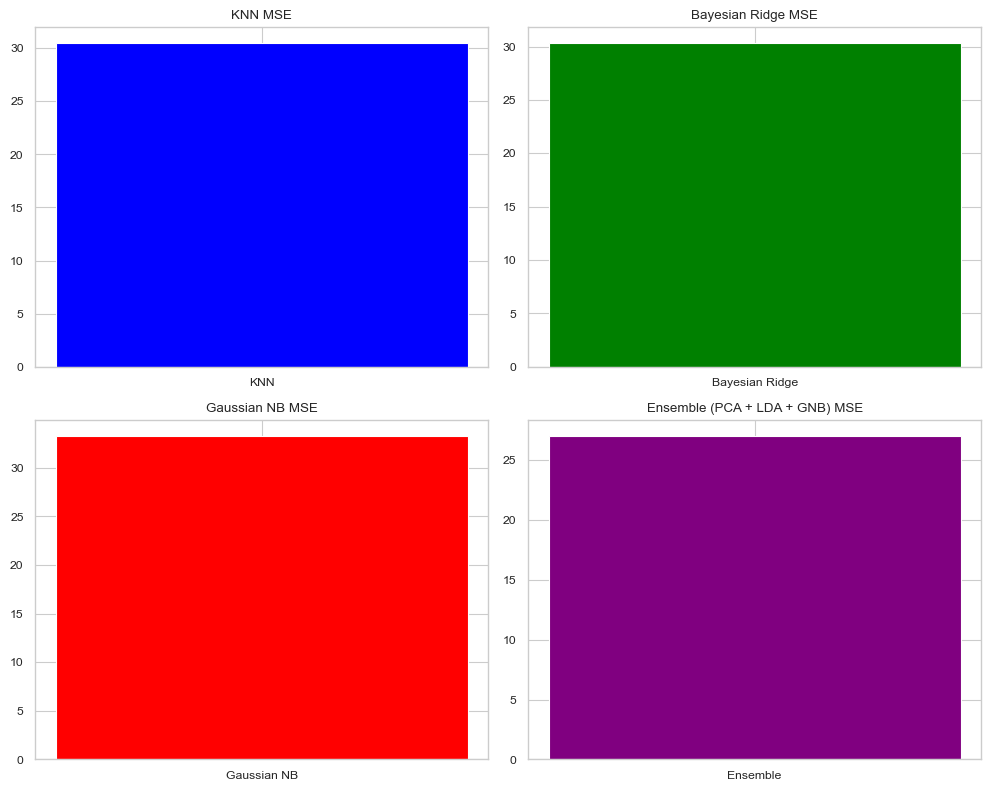

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have computed the MSE values (knn_mse, br_mse, gnb_mse, ensemble_mse)

# Plotting individual model MSE
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

axes[0, 0].bar(['KNN'], [np.sqrt(knn_mse)], color='blue')
axes[0, 0].set_title('KNN MSE')

axes[0, 1].bar(['Bayesian Ridge'], [np.sqrt(br_mse)], color='green')
axes[0, 1].set_title('Bayesian Ridge MSE')

axes[1, 0].bar(['Gaussian NB'], [np.sqrt(gnb_mse)], color='red')
axes[1, 0].set_title('Gaussian NB MSE')

axes[1, 1].bar(['Ensemble'], [np.sqrt(ensemble_mse)], color='purple')
axes[1, 1].set_title('Ensemble (PCA + LDA + GNB) MSE')

plt.tight_layout()
plt.show()


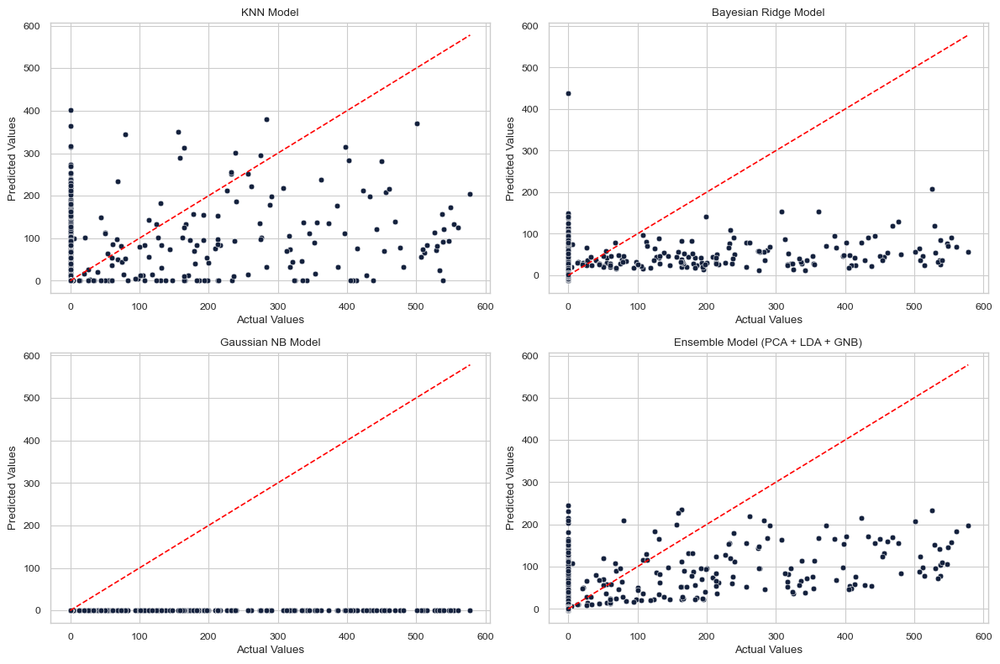

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming you have computed the predictions (knn_pred, br_pred, gnb_pred, ensemble_pred)

# Plotting actual vs predicted values
plt.figure(figsize=(12, 8))

# KNN Model
plt.subplot(2, 2, 1)
sns.scatterplot(x=y_test, y=knn_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')
plt.title('KNN Model')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Bayesian Ridge Model
plt.subplot(2, 2, 2)
sns.scatterplot(x=y_test, y=br_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')
plt.title('Bayesian Ridge Model')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Gaussian NB Model
plt.subplot(2, 2, 3)
sns.scatterplot(x=y_test, y=gnb_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')
plt.title('Gaussian NB Model')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

# Ensemble Model
plt.subplot(2, 2, 4)
sns.scatterplot(x=y_test, y=ensemble_pred)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')
plt.title('Ensemble Model (PCA + LDA + GNB)')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

plt.tight_layout()
plt.show()


In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsRegressor
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import StandardScaler




In [34]:
# Assuming df_train is your dataframe

# K-Means clustering
kmeans = KMeans(n_clusters=5, random_state=42)
df_train['kmeans_cluster'] = kmeans.fit_predict(X)


In [35]:
# KNN Regressor
knn_regressor = KNeighborsRegressor(n_neighbors=25)
knn_regressor.fit(X, y)
df_train['knn_regression'] = knn_regressor.predict(X)

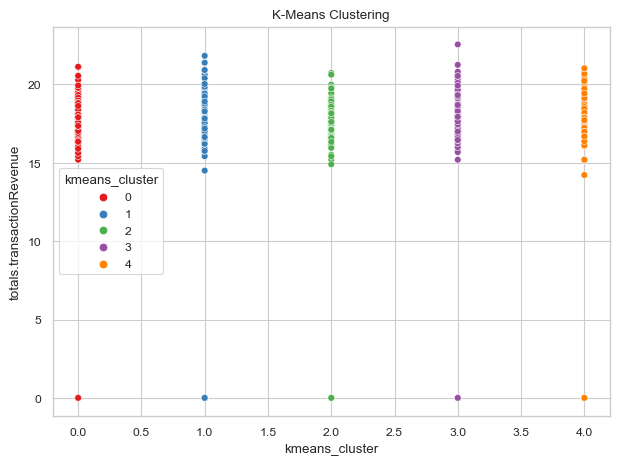

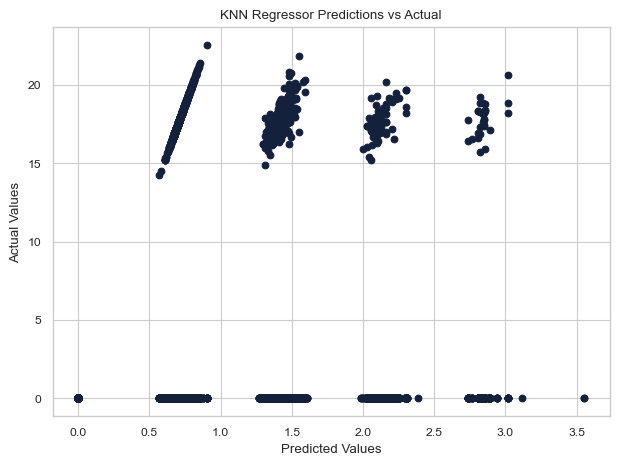

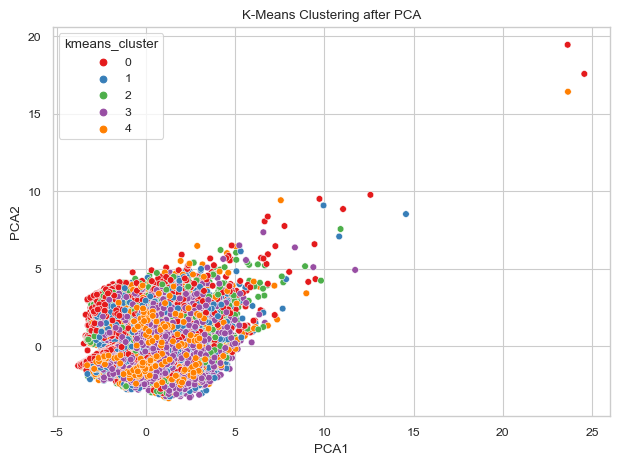

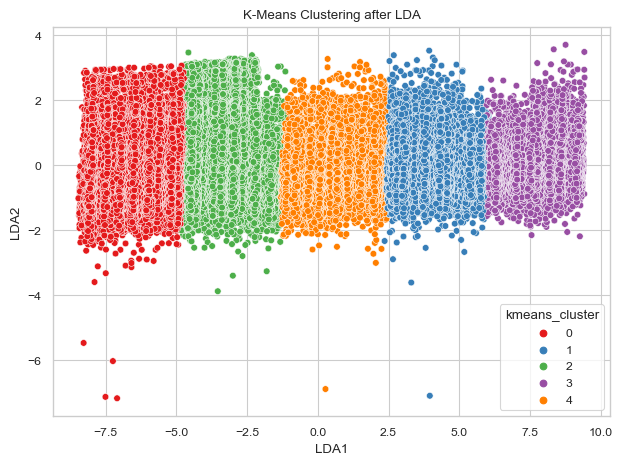

In [36]:





# Visualization of K-Means clustering
sns.scatterplot(x='kmeans_cluster', y="totals.transactionRevenue", hue='kmeans_cluster', data=df_train, palette='Set1')
plt.title('K-Means Clustering')
plt.show()



# Visualization of KNN Regressor predictions
plt.scatter(df_train['knn_regression'], y)
plt.title('KNN Regressor Predictions vs Actual')
plt.xlabel('Predicted Values')
plt.ylabel('Actual Values')
plt.show()

# PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df_train[['PCA1', 'PCA2']] = principal_components

# Visualization after PCA
sns.scatterplot(x='PCA1', y='PCA2', hue='kmeans_cluster', data=df_train, palette='Set1')
plt.title('K-Means Clustering after PCA')
plt.show()



# LDA
lda = LinearDiscriminantAnalysis(n_components=2)
X_lda = lda.fit_transform(X_scaled, df_train['kmeans_cluster'])

df_train[['LDA1', 'LDA2']] = X_lda

# Visualization after LDA
sns.scatterplot(x='LDA1', y='LDA2', hue='kmeans_cluster', data=df_train, palette='Set1')
plt.title('K-Means Clustering after LDA')
plt.show()



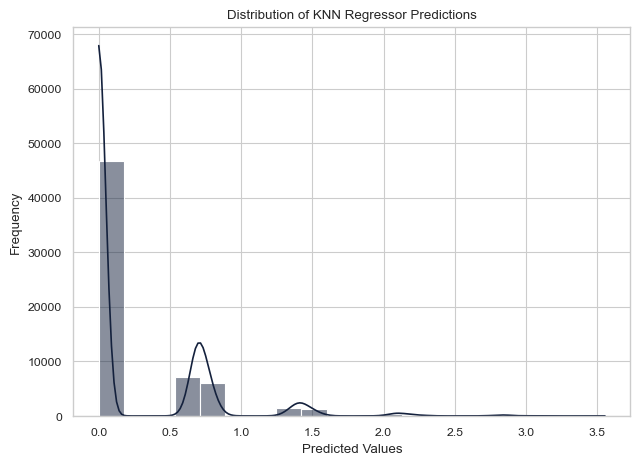

In [37]:
sns.histplot(df_train['knn_regression'], bins=20, kde=True)
plt.title('Distribution of KNN Regressor Predictions')
plt.xlabel('Predicted Values')
plt.ylabel('Frequency')
plt.show()


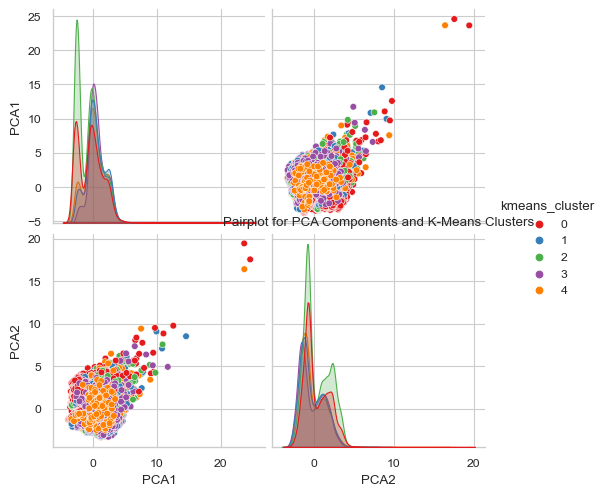

In [38]:
sns.pairplot(df_train[['PCA1', 'PCA2', 'kmeans_cluster']], hue='kmeans_cluster', palette='Set1')
plt.title('Pairplot for PCA Components and K-Means Clusters')
plt.show()


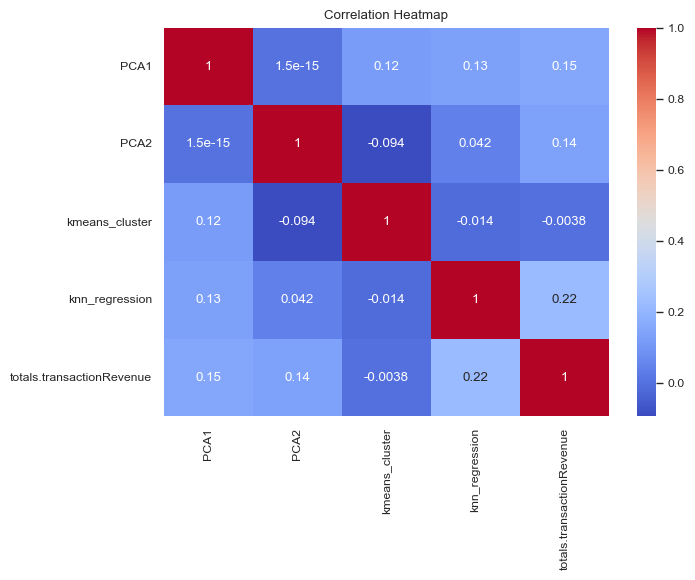

In [39]:
correlation_matrix = df_train[['PCA1', 'PCA2', 'kmeans_cluster', 'knn_regression', 'totals.transactionRevenue']].corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


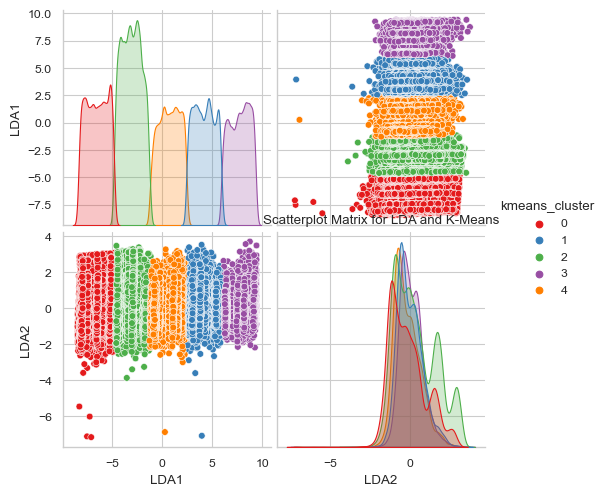

In [40]:
sns.pairplot(df_train[['LDA1', 'LDA2', 'kmeans_cluster']], hue='kmeans_cluster', palette='Set1')
plt.title('Scatterplot Matrix for LDA and K-Means')
plt.show()


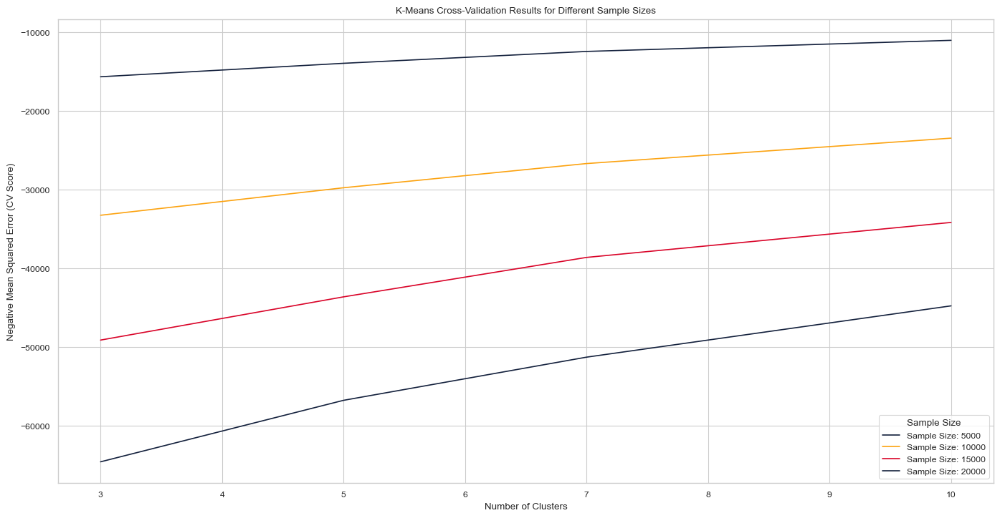

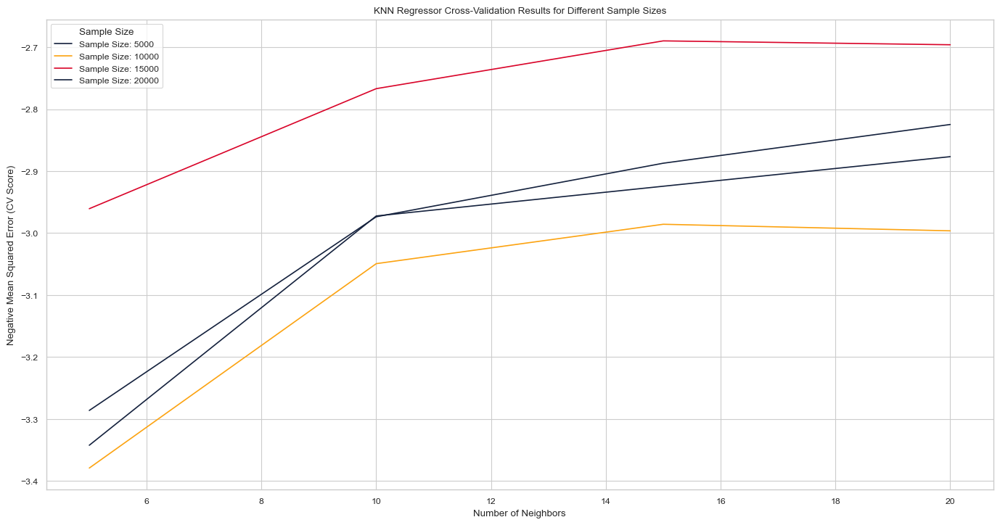

In [41]:
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define different sample sizes
sample_sizes = [5000, 10000, 15000, 20000]

# Initialize empty lists to store results
results_kmeans_list = []
results_knn_list = []

for sample_size in sample_sizes:
    # Sample data for faster computation
    X_sample = X_scaled[:sample_size]
    y_sample = y[:sample_size]

    # K-Means Cross-Validation
    kmeans = KMeans(random_state=42)
    param_grid_kmeans = {'n_clusters': [3, 5, 7, 10]}
    grid_kmeans = GridSearchCV(kmeans, param_grid_kmeans, cv=5)
    grid_kmeans.fit(X_sample)

    # KNN Regressor Cross-Validation
    knn_regressor = KNeighborsRegressor()
    param_grid_knn = {'n_neighbors': [5, 10, 15, 20]}
    grid_knn = GridSearchCV(knn_regressor, param_grid_knn, cv=5, scoring='neg_mean_squared_error')
    grid_knn.fit(X_sample, y_sample)

    # Store results
    results_kmeans_list.append(pd.DataFrame(grid_kmeans.cv_results_))
    results_knn_list.append(pd.DataFrame(grid_knn.cv_results_))

# Visualize Results for K-Means
plt.figure(figsize=(15, 8))
for i, sample_size in enumerate(sample_sizes):
    sns.lineplot(x='param_n_clusters', y='mean_test_score', data=results_kmeans_list[i], label=f'Sample Size: {sample_size}')

plt.title('K-Means Cross-Validation Results for Different Sample Sizes')
plt.xlabel('Number of Clusters')
plt.ylabel('Negative Mean Squared Error (CV Score)')
plt.legend(title='Sample Size')
plt.show()

# Visualize Results for KNN Regressor
plt.figure(figsize=(15, 8))
for i, sample_size in enumerate(sample_sizes):
    sns.lineplot(x='param_n_neighbors', y='mean_test_score', data=results_knn_list[i], label=f'Sample Size: {sample_size}')

plt.title('KNN Regressor Cross-Validation Results for Different Sample Sizes')
plt.xlabel('Number of Neighbors')
plt.ylabel('Negative Mean Squared Error (CV Score)')
plt.legend(title='Sample Size')
plt.show()

Cross-Validation Results:
   Fold  KNN Regressor Score
0     1             2.909028
1     2             3.241449
2     3             3.189849
3     4             2.680555
4     5             2.693166


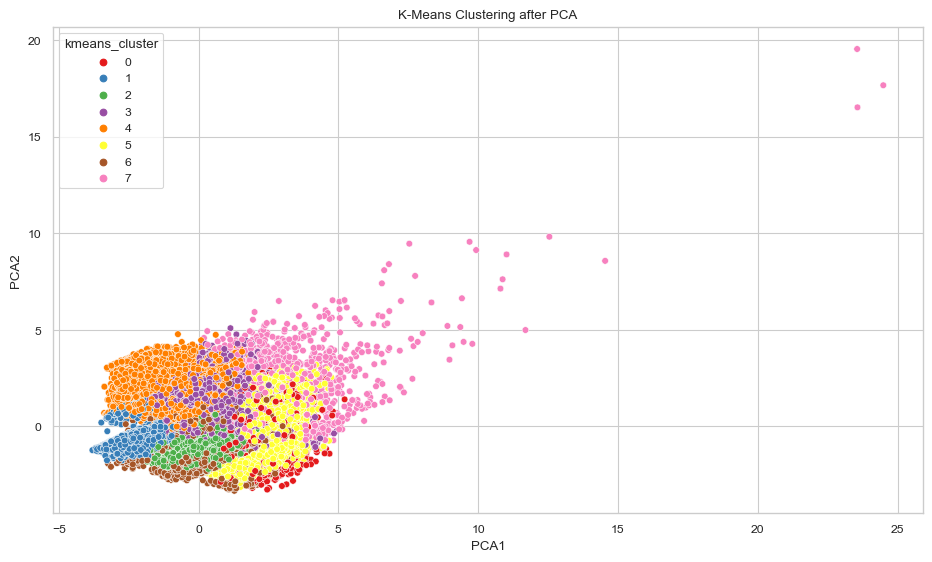

In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA



# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Define the number of folds for k-fold cross-validation
k_folds = 5

# Initialize K-Means and KNN Regressor
knn_regressor = KNeighborsRegressor(n_neighbors=25)

# Perform k-fold cross-validation for K-Means
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Perform k-fold cross-validation for KNN Regressor
knn_scores = cross_val_score(knn_regressor, X_scaled, y, cv=kf, scoring='neg_mean_squared_error')

# Tabulate the results
results_df = pd.DataFrame({
    'Fold': range(1, k_folds + 1),
    'KNN Regressor Score': -knn_scores
})

print("Cross-Validation Results:")
print(results_df)

# Visualize clusters using PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df_train[['PCA1', 'PCA2']] = principal_components
df_train['kmeans_cluster'] = kmeans.fit_predict(X_scaled)

plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='kmeans_cluster', data=df_train, palette='Set1')
plt.title('K-Means Clustering after PCA')
plt.show()


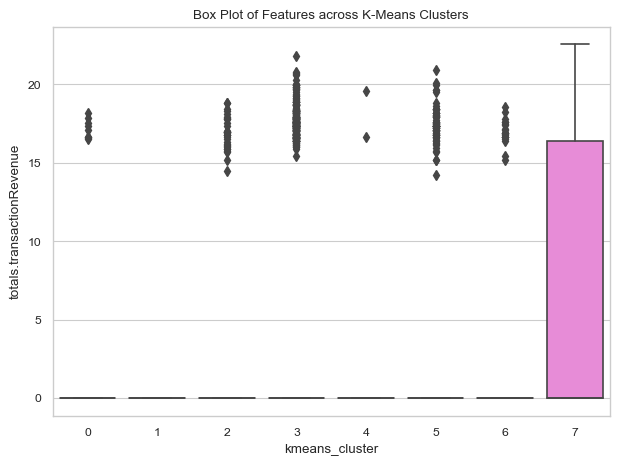

In [45]:
sns.boxplot(x='kmeans_cluster', y=y, data=df_train)
plt.title('Box Plot of Features across K-Means Clusters')
plt.show()


In [47]:
import plotly.express as px
fig = px.scatter_3d(df_train, x='PCA1', y='PCA2', z=y, color='kmeans_cluster')
fig.show()


In [48]:
import plotly.graph_objects as go
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_train['knn_regression'], y=y, mode='markers'))
fig.update_layout(title='KNN Regressor Predictions vs Actual', xaxis_title='Predicted Values', yaxis_title='Actual Values')
fig.show()


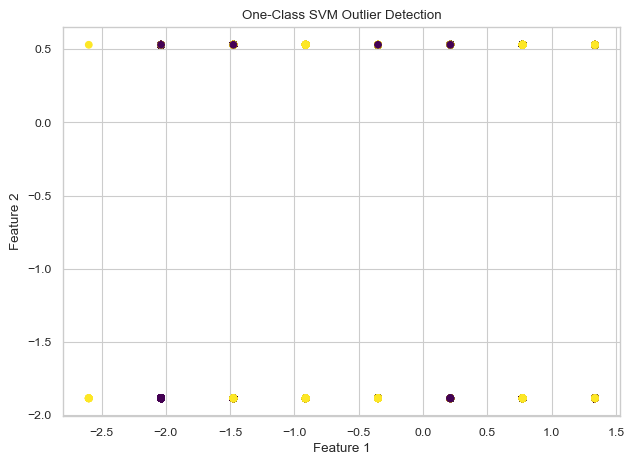

In [41]:
import numpy as np
import matplotlib.pyplot as plt



class OneClassSVM:
    def __init__(self, nu=0.1, kernel='linear', gamma='scale'):
        self.nu = nu
        self.kernel = kernel
        self.gamma = gamma
        self.support_vectors_ = None
        self.support_dual_coefficients_ = None
        self.intercept_ = None

    def fit(self, X):
        n_samples, n_features = X.shape

        # Initialize Lagrange multipliers and bias
        alpha = np.zeros(n_samples)
        b = 0

        # Compute the Gram matrix
        K = self.kernel_function(X, X)

        # Training iterations
        for _ in range(100):
            for i in range(n_samples):
                # Compute the decision function
                decision_function = np.sum(alpha * K[i, :]) - b

                # Update Lagrange multipliers
                if alpha[i] < self.nu / 2:
                    if decision_function < 1:
                        alpha[i] += 1
                elif alpha[i] > 0:
                    if decision_function > 1:
                        alpha[i] -= 1

            # Update bias
            b = np.sum(alpha * (1 - K.diagonal())) / np.sum(alpha)

        # Save support vectors and dual coefficients
        self.support_vectors_ = X[alpha > 0]
        self.support_dual_coefficients_ = alpha[alpha > 0]

        # Compute intercept
        self.intercept_ = np.mean(1 - np.dot(self.support_dual_coefficients_, K[alpha > 0, :].T))

    def decision_function(self, X):
        # Compute the decision function for new data points
        K = self.kernel_function(X, self.support_vectors_)
        return np.sum(self.support_dual_coefficients_ * K, axis=1) - self.intercept_

    def predict(self, X, threshold=0):
        # Classify data points based on the decision function
        decision_function = self.decision_function(X)
        return np.where(decision_function >= threshold, 1, -1)

    def kernel_function(self, X1, X2):
        # Linear kernel function
        return np.dot(X1, X2.T)


svm = OneClassSVM(nu=0.1)
svm.fit(X_train)

# Assuming X_test is your test data
predictions = svm.predict(X_test)

# Visualize the results (assuming 2D data for simplicity)
plt.scatter(X_test[:, 0], X_test[:, 1], c=predictions, cmap='viridis')
plt.title('One-Class SVM Outlier Detection')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()



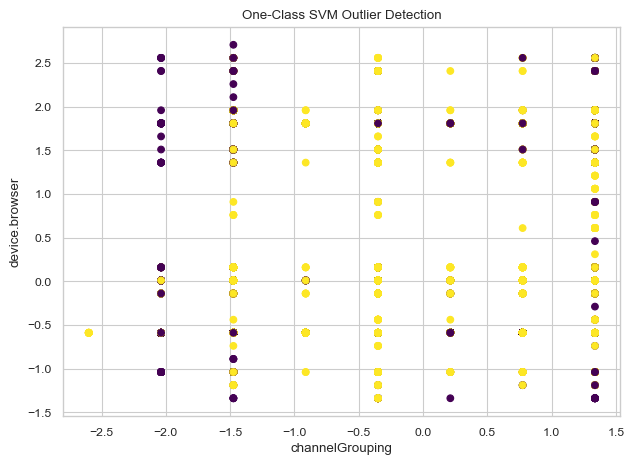

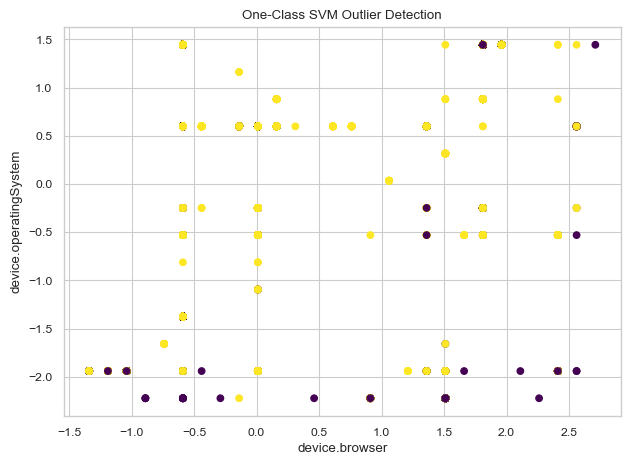

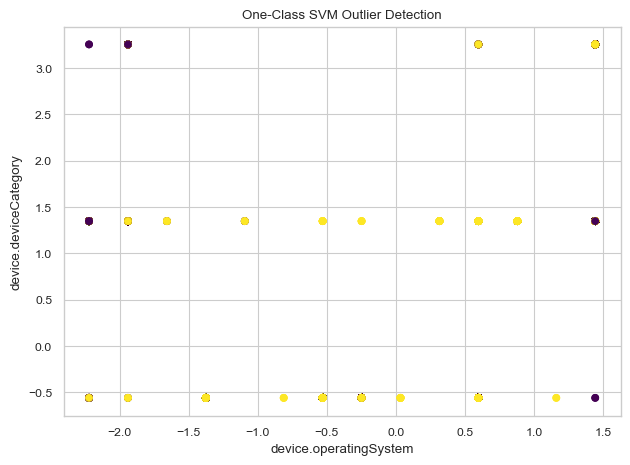

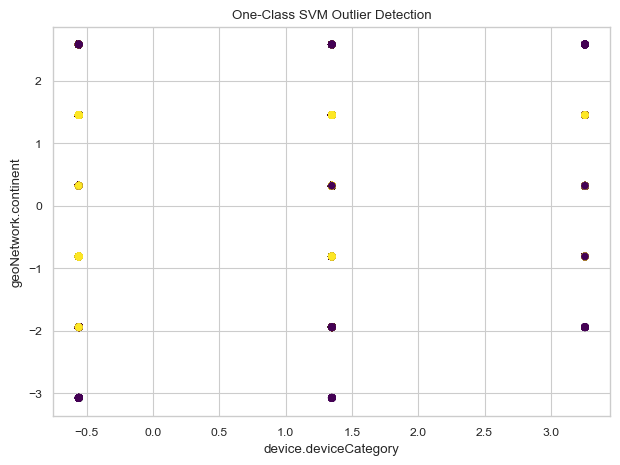

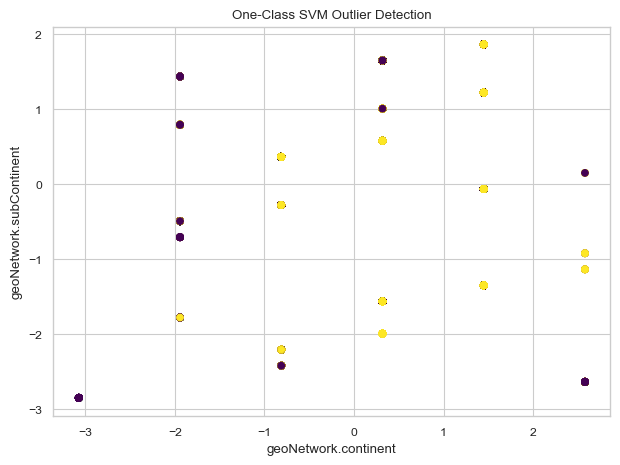

...

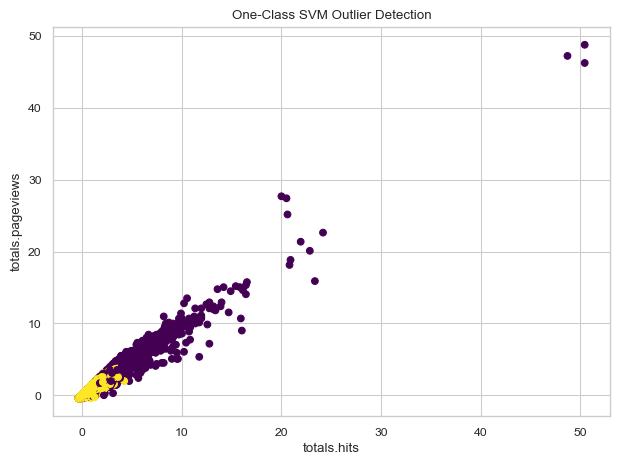

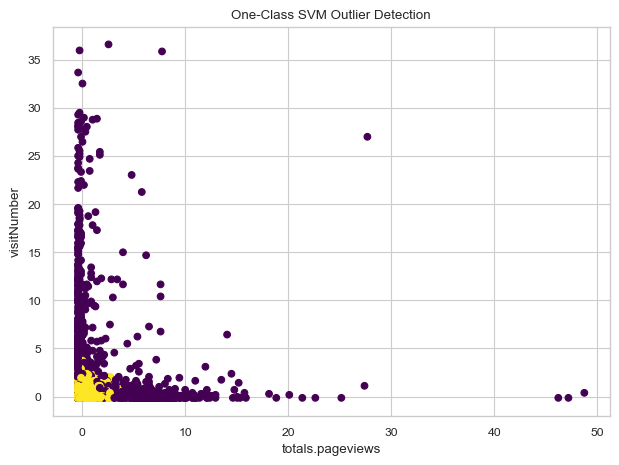

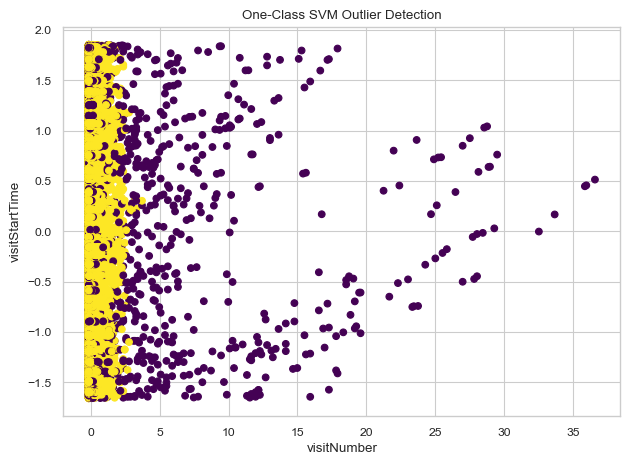

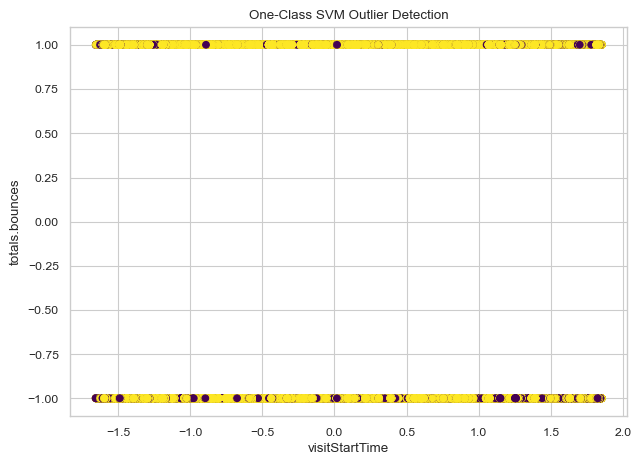

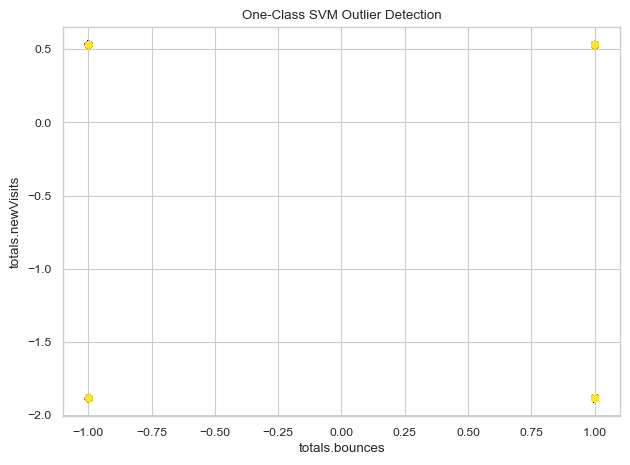

In [45]:

for i in range(19):
    plt.scatter(X_scaled[:, i], X_scaled[:, i+1], c=predictions, cmap='viridis')
    plt.title('One-Class SVM Outlier Detection')
    plt.xlabel(X.columns[i])
    plt.ylabel(X.columns[i+1])
    plt.show()

In [43]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Load the Iris dataset
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_enc, test_size=0.2, random_state=42)

# Standardize the data


# Initialize the SVM classifier
svm_classifier = SVC(kernel='linear', C=1.0, random_state=42)

# Train the classifier
svm_classifier.fit(X_train, y_train)

# Make predictions on the test set
y_pred = svm_classifier.predict(X_test)

# Evaluate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.99


Log Likelihood: -11.981890704976252


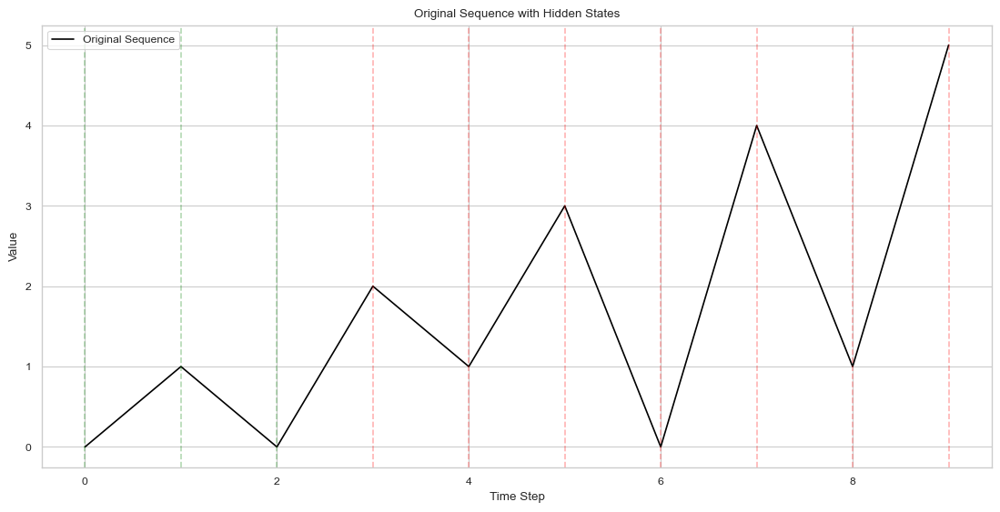

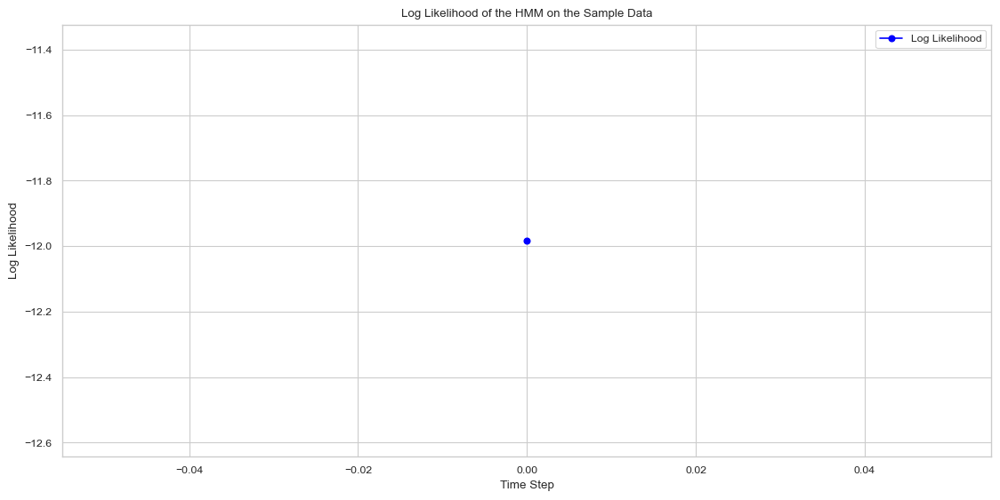

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from hmmlearn import hmm
from sklearn.preprocessing import StandardScaler


# Assuming 'totals.transactionRevenue' is the column you want to model
feature_column = 'totals.transactionRevenue'

# Extract and standardize the feature
X = df_train[feature_column].values.reshape(-1, 1)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Fit the HMM model
n_components = 2  # Adjust the number of components as needed
model = hmm.GaussianHMM(n_components=n_components, covariance_type="full")
model.fit(X_scaled)

# Predict hidden states and log likelihood
hidden_states = model.predict(X_scaled)
log_likelihood = model.score_samples(X_scaled)[0]

# Print the log likelihood value
print(f"Log Likelihood: {log_likelihood}")

# Plot the original sequence with hidden states
plt.figure(figsize=(12, 6))
plt.plot(df_train[feature_column], label='Original Sequence', color='black')

# Highlight the normal and anomaly regions
for i, state in enumerate(hidden_states):
    color = 'green' if state == 0 else 'red'
    plt.axvline(x=i, color=color, linestyle='--', alpha=0.3)

plt.title('Original Sequence with Hidden States')
plt.xlabel('Time Step')
plt.ylabel('Value')
plt.legend()
plt.show()

# Plot the log likelihood values
plt.figure(figsize=(12, 6))
plt.plot(log_likelihood, label='Log Likelihood', color='blue', marker='o')
plt.title('Log Likelihood of the HMM on the Sample Data')
plt.xlabel('Time Step')
plt.ylabel('Log Likelihood')
plt.legend()
plt.show()
